In [5]:
# install packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from sklearn import preprocessing
from scipy.stats import gaussian_kde
from sklearn.cluster import KMeans
from collections import Counter
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.manifold import MDS
import os

pd.options.display.float_format = '{:,.2f}'.format
import warnings
warnings.filterwarnings("ignore")

In [3]:
current_dir = os.getcwd()
data = pd.read_csv('Melbourne_housing_FULL.csv')

In [4]:
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.50,"3,067.00",...,1.00,1.00,126.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
1,Abbotsford,85 Turner St,2,h,"1,480,000.00",S,Biggin,3/12/2016,2.50,"3,067.00",...,1.00,1.00,202.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
2,Abbotsford,25 Bloomburg St,2,h,"1,035,000.00",S,Biggin,4/02/2016,2.50,"3,067.00",...,1.00,0.00,156.00,79.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.50,"3,067.00",...,2.00,1.00,0.00,NaN,NaN,Yarra City Council,-37.81,145.01,Northern Metropolitan,"4,019.00"
4,Abbotsford,5 Charles St,3,h,"1,465,000.00",SP,Biggin,4/03/2017,2.50,"3,067.00",...,2.00,0.00,134.00,150.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"


In [4]:
data.dtypes

Suburb            object
Address           object
Rooms              int64
Type              object
Price            float64
Method            object
SellerG           object
Date              object
Distance         float64
Postcode         float64
Bedroom2         float64
Bathroom         float64
Car              float64
Landsize         float64
BuildingArea     float64
YearBuilt        float64
CouncilArea       object
Lattitude        float64
Longtitude       float64
Regionname        object
Propertycount    float64
dtype: object

In [5]:
print(data.describe())

          Rooms         Price  Distance  Postcode  Bedroom2  Bathroom  \
count 34,857.00     27,247.00 34,856.00 34,856.00 26,640.00 26,631.00   
mean       3.03  1,050,173.34     11.18  3,116.06      3.08      1.62   
std        0.97    641,467.13      6.79    109.02      0.98      0.72   
min        1.00     85,000.00      0.00  3,000.00      0.00      0.00   
25%        2.00    635,000.00      6.40  3,051.00      2.00      1.00   
50%        3.00    870,000.00     10.30  3,103.00      3.00      2.00   
75%        4.00  1,295,000.00     14.00  3,156.00      4.00      2.00   
max       16.00 11,200,000.00     48.10  3,978.00     30.00     12.00   

            Car   Landsize  BuildingArea  YearBuilt  Lattitude  Longtitude  \
count 26,129.00  23,047.00     13,742.00  15,551.00  26,881.00   26,881.00   
mean       1.73     593.60        160.26   1,965.29     -37.81      145.00   
std        1.01   3,398.84        401.27      37.33       0.09        0.12   
min        0.00       0.00    

In [6]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         34857 non-null  object 
 1   Address        34857 non-null  object 
 2   Rooms          34857 non-null  int64  
 3   Type           34857 non-null  object 
 4   Price          27247 non-null  float64
 5   Method         34857 non-null  object 
 6   SellerG        34857 non-null  object 
 7   Date           34857 non-null  object 
 8   Distance       34856 non-null  float64
 9   Postcode       34856 non-null  float64
 10  Bedroom2       26640 non-null  float64
 11  Bathroom       26631 non-null  float64
 12  Car            26129 non-null  float64
 13  Landsize       23047 non-null  float64
 14  BuildingArea   13742 non-null  float64
 15  YearBuilt      15551 non-null  float64
 16  CouncilArea    34854 non-null  object 
 17  Lattitude      26881 non-null  float64
 18  Longti

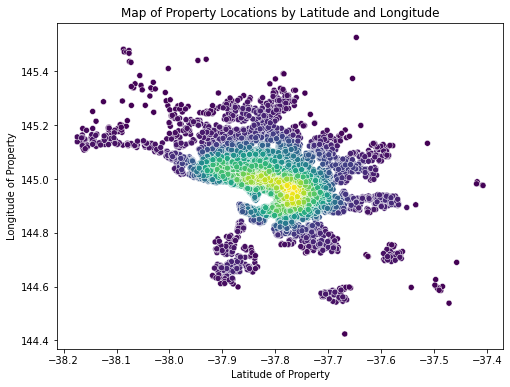

In [7]:
# Density scatterplot: locations of properties by longitude and latitude
data_na = data.dropna()
values = np.stack([data_na['Lattitude'], data_na['Longtitude']])
kernel = stats.gaussian_kde(values)(values)

fix, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(x='Lattitude', y='Longtitude', data=data_na, c=kernel, cmap='viridis', ax=ax)
# Add title and axis names
plt.title('Map of Property Locations by Latitude and Longitude')
plt.xlabel('Latitude of Property')
plt.ylabel('Longitude of Property')
plt.show();

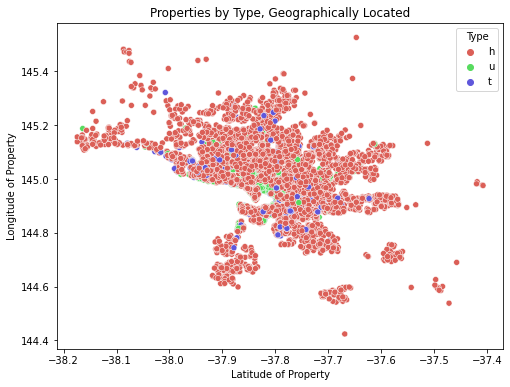

In [8]:
# Graph of properties by Type
# This is what we need to identify with the clustering algorithm

values = np.stack([data_na['Lattitude'], data_na['Longtitude']])
kernel = stats.gaussian_kde(values)(values)

fix, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(x='Lattitude', y='Longtitude', data=data_na, c=kernel, hue="Type", palette=sns.color_palette("hls", 3), ax=ax)
ax.set_title('Properties by Type, Geographically Located')
ax.set_xlabel('Latitude of Property')
ax.set_ylabel('Longitude of Property');

## get data and keep only the required data

In [9]:
# Keep only columns required for assignment, keep only non-NAN data
features = ['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom',
            'Car', 'Landsize', 'BuildingArea','YearBuilt', 'Type', 
            'Suburb', 'Lattitude', 'Longtitude', 'Propertycount']
#dataset
all_data = data[features]
all_data.isna().sum()

Rooms                0
Price             7610
Distance             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
Type                 0
Suburb               0
Lattitude         7976
Longtitude        7976
Propertycount        3
dtype: int64

In [10]:
# remove all Nas
all_data = all_data.dropna(axis=0, how='any').reset_index()
all_data = all_data.drop(columns=['index'], axis=1)
all_data.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Type,Suburb,Lattitude,Longtitude,Propertycount
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",h,Abbotsford,-37.81,144.99,"4,019.00"
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",h,Abbotsford,-37.81,144.99,"4,019.00"
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",h,Abbotsford,-37.81,144.99,"4,019.00"
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",h,Abbotsford,-37.80,145.00,"4,019.00"
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",h,Abbotsford,-37.81,145.00,"4,019.00"


In [11]:
# dummy code categorical variables
columns_alldata = all_data.columns
num_names = all_data._get_numeric_data().columns
cat_names = list(set(columns_alldata)-set(num_names))
print('Categorical variables: ', cat_names)

# drop suburb for analysis so only dummy coding for Type
dummy_data = pd.get_dummies(all_data, columns = ['Type'])
dummy_data

Categorical variables:  ['Type', 'Suburb']


,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Suburb,Lattitude,Longtitude,Propertycount,Type_h,Type_t,Type_u
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",Abbotsford,-37.81,144.99,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",Abbotsford,-37.81,144.99,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",Abbotsford,-37.81,144.99,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",Abbotsford,-37.80,145.00,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",Abbotsford,-37.81,145.00,"4,019.00",1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8882,3,"500,000.00",25.50,3.00,2.00,2.00,383.00,118.00,"2,016.00",Wollert,-37.62,145.04,"2,940.00",1,0,0
8883,3,"570,000.00",25.50,3.00,2.00,2.00,404.00,158.00,"2,012.00",Wollert,-37.61,145.03,"2,940.00",1,0,0
8884,2,"888,000.00",6.30,2.00,2.00,1.00,98.00,104.00,"2,018.00",Yarraville,-37.82,144.89,"6,543.00",1,0,0
8885,2,"705,000.00",6.30,2.00,1.00,2.00,220.00,120.00,"2,000.00",Yarraville,-37.82,144.88,"6,543.00",0,1,0


<AxesSubplot:>

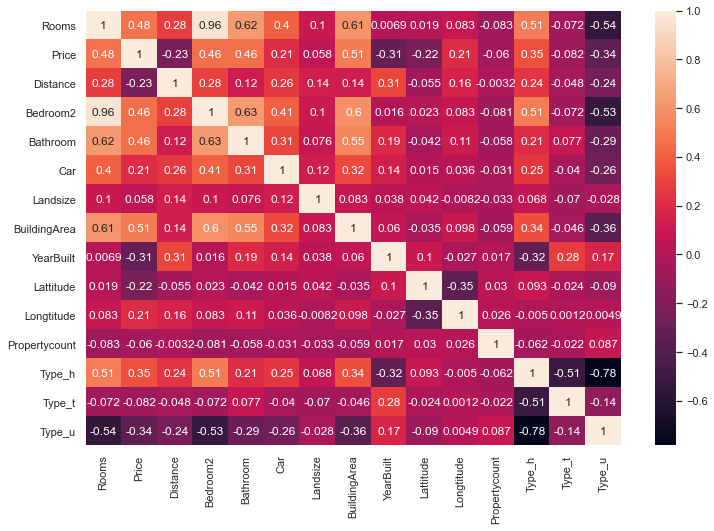

In [12]:
# check correlations among variables
sns.set(rc = {'figure.figsize':(12,8)})
sns.heatmap(dummy_data.corr(), annot = True)

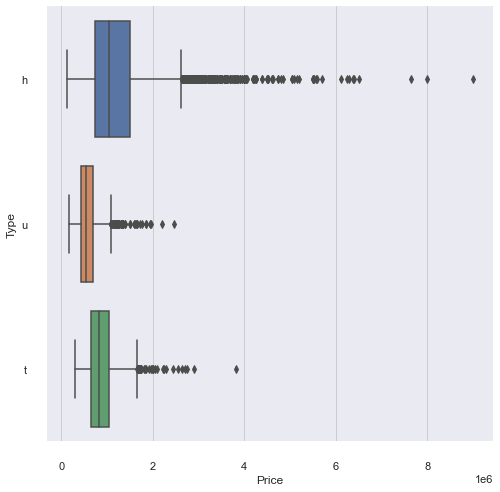

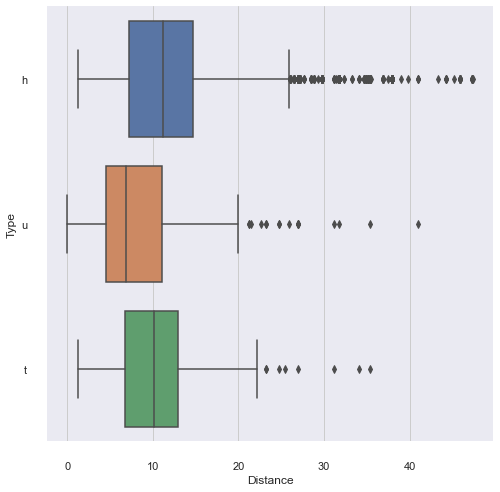

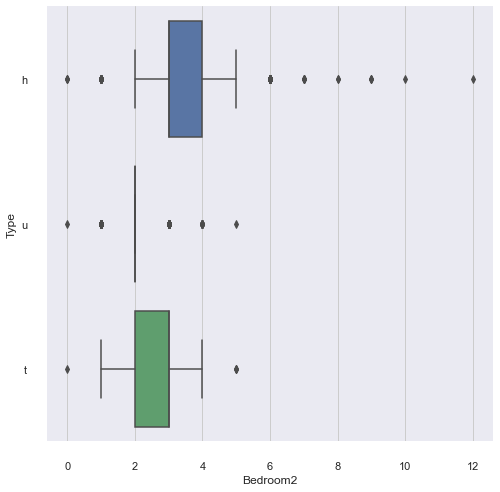

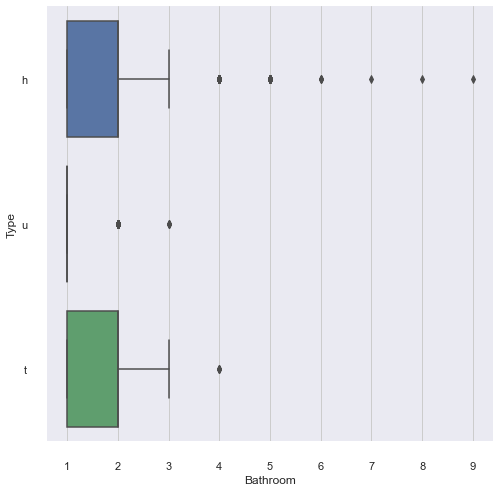

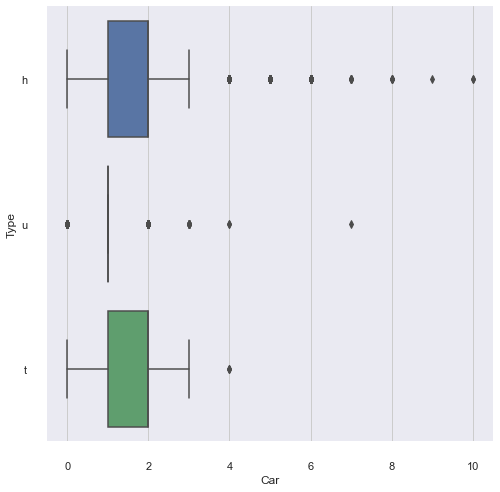

...

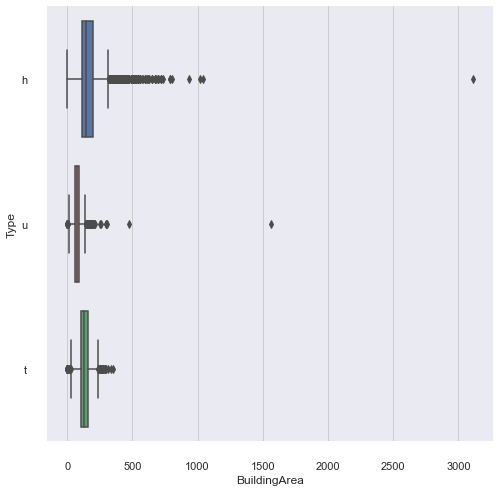

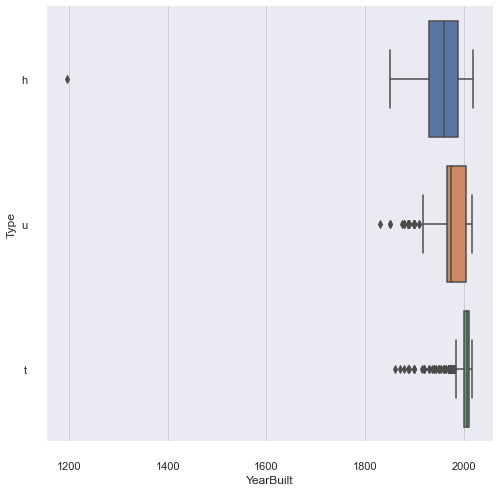

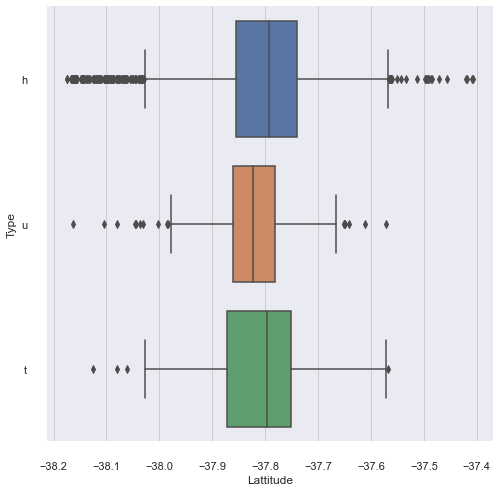

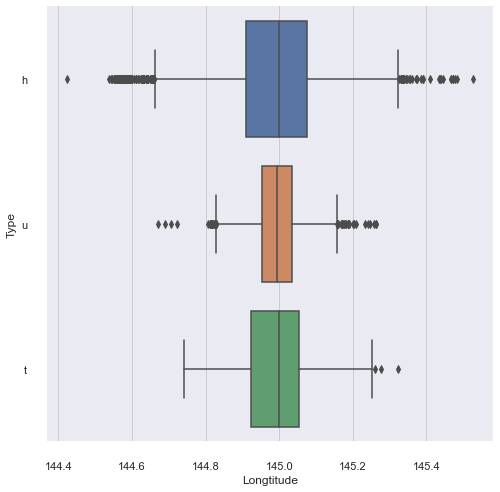

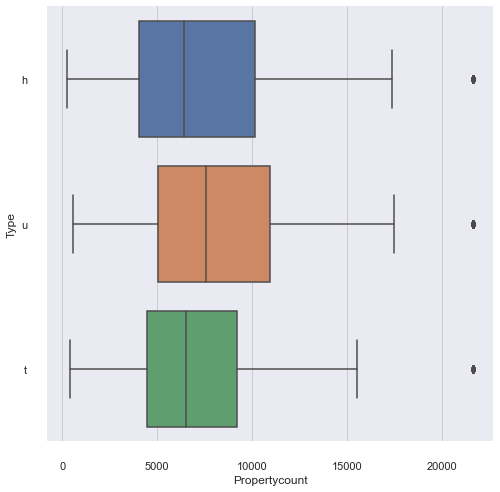

In [13]:
#EDA/Boxplot
cont_data = all_data.select_dtypes(include = ['float64'])
cont_data['Type'] = all_data['Type']

cols = ['Type']  + [col for col in cont_data if col != 'Type']
cont_data = cont_data[cols]

for column in cont_data.columns[1:]:
    sns.set()
    fig, ax = plt.subplots()
    sns.set(style="ticks")
    sns.boxplot(x=column, y='Type', data=cont_data)
    sns.despine(offset=10, trim=True)
    fig.set_size_inches(8,8)

In [14]:
# column for 'Type' for comparison at the end and drop Type from all_data
additional_data = all_data[['Type', 'Suburb', 'Longtitude', 'Lattitude','Propertycount']]
all_data = all_data.drop(['Type', 'Suburb', 'Longtitude', 'Lattitude','Propertycount'], axis=1)
all_data

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00"
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00"
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00"
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00"
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00"
...,...,...,...,...,...,...,...,...,...
8882,3,"500,000.00",25.50,3.00,2.00,2.00,383.00,118.00,"2,016.00"
8883,3,"570,000.00",25.50,3.00,2.00,2.00,404.00,158.00,"2,012.00"
8884,2,"888,000.00",6.30,2.00,2.00,1.00,98.00,104.00,"2,018.00"
8885,2,"705,000.00",6.30,2.00,1.00,2.00,220.00,120.00,"2,000.00"


In [15]:
additional_data = pd.DataFrame(additional_data)
additional_data.head()

,Type,Suburb,Longtitude,Lattitude,Propertycount
0,h,Abbotsford,144.99,-37.81,"4,019.00"
1,h,Abbotsford,144.99,-37.81,"4,019.00"
2,h,Abbotsford,144.99,-37.81,"4,019.00"
3,h,Abbotsford,145.00,-37.80,"4,019.00"
4,h,Abbotsford,145.00,-37.81,"4,019.00"


In [16]:
all_data.isna().sum()

Rooms           0
Price           0
Distance        0
Bedroom2        0
Bathroom        0
Car             0
Landsize        0
BuildingArea    0
YearBuilt       0
dtype: int64

In [17]:
all_data

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00"
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00"
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00"
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00"
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00"
...,...,...,...,...,...,...,...,...,...
8882,3,"500,000.00",25.50,3.00,2.00,2.00,383.00,118.00,"2,016.00"
8883,3,"570,000.00",25.50,3.00,2.00,2.00,404.00,158.00,"2,012.00"
8884,2,"888,000.00",6.30,2.00,2.00,1.00,98.00,104.00,"2,018.00"
8885,2,"705,000.00",6.30,2.00,1.00,2.00,220.00,120.00,"2,000.00"


## Preparing data for Analysis with standardscaler

In [16]:
# scaling the dataset
standard_scaler_1 = StandardScaler()
scaled_data = standard_scaler_1.fit(all_data).transform(all_data)
scaled_data[1]

# https://stats.stackexchange.com/questions/483187/difference-between-log-transformation-and-standardization

array([-0.10263075,  0.54773215, -1.27695046, -0.08093864,  0.48997285,
       -1.73491006, -0.3669965 ,  0.00785394, -1.77525628])

In [17]:
len(scaled_data)

8887

## Using KMeans with standardscaler

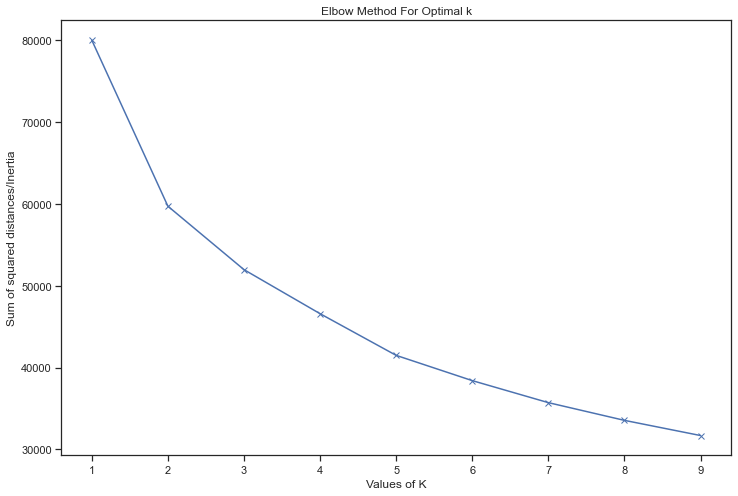

In [20]:
#elbow method to determine number of clusters
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(scaled_data)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

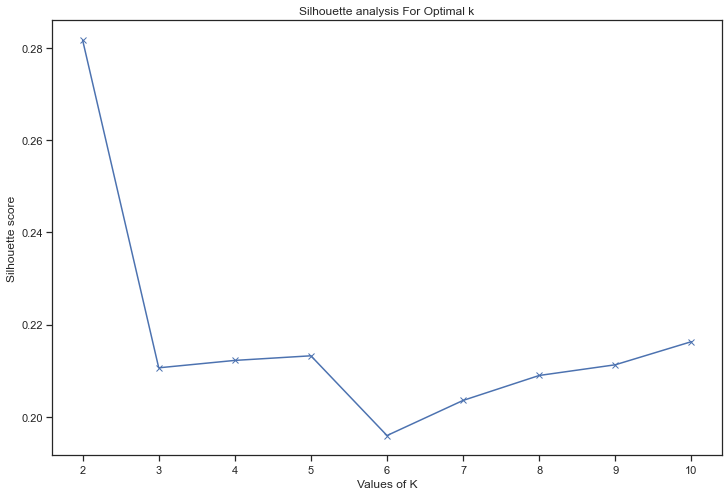

In [21]:
#Silhouette analysis for optimal k

from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
silhouette_avg = []
for num_clusters in range_n_clusters:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(scaled_data)
 cluster_labels = kmeans.labels_
 
 # silhouette score
 silhouette_avg.append(silhouette_score(scaled_data, cluster_labels))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [18]:
# from the KMeans analysis it appears that number of clusters = 4 is the best
kmeans = KMeans(n_clusters = 5, random_state = 0).fit_predict(scaled_data)

In [19]:
print(len(all_data))
print(len(scaled_data))
print(len(kmeans))

8887
8887
8887


In [20]:
# creating a new column to variables with kmeans
kmeans_standard_scaler = all_data.copy()
kmeans_standard_scaler['kmeans_groups'] = kmeans
kmeans_standard_scaler.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",2
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",2
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",1
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",2
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",2


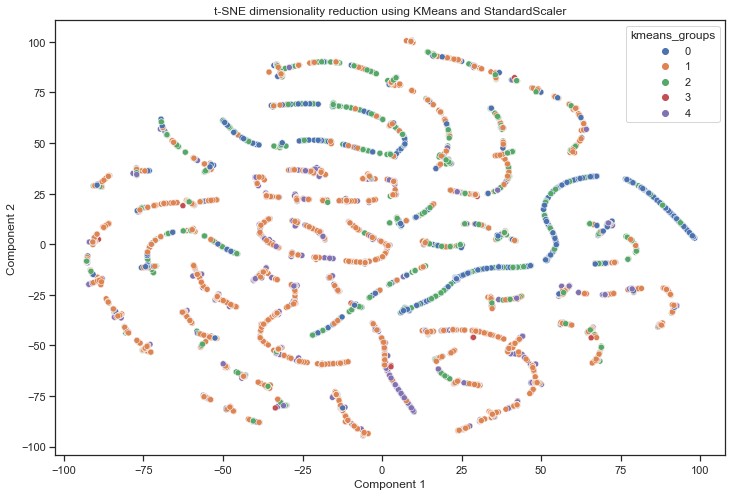

In [25]:
# perform t-SNE on grouping parameters
tsne = TSNE()
X_stdscaler_kmeans = tsne.fit_transform(kmeans_standard_scaler)

sns.scatterplot(X_stdscaler_kmeans[:,0], X_stdscaler_kmeans[:,1],
               hue = kmeans_standard_scaler['kmeans_groups'],
                legend = 'full', palette = 'deep').set(title = 
                                     't-SNE dimensionality reduction using KMeans and StandardScaler',
                                    xlabel = 'Component 1',
                                    ylabel = 'Component 2');


<AxesSubplot:>

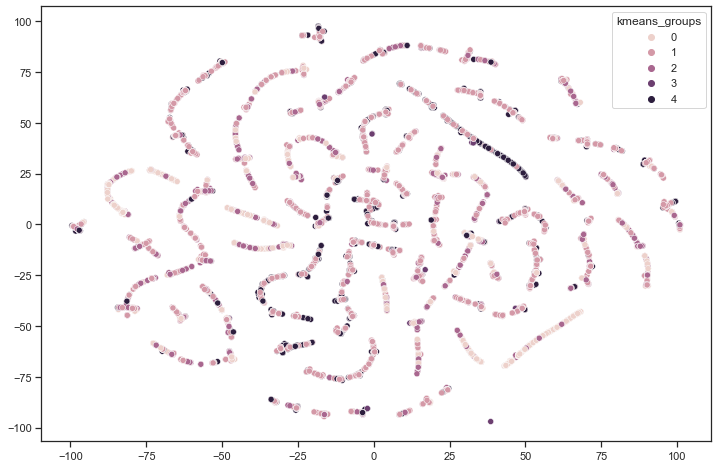

In [26]:
TSNE(n_components=2, perplexity=30.0, verbose=0)
X_stdscaler_kmeans = tsne.fit_transform(kmeans_standard_scaler)

sns.scatterplot(X_stdscaler_kmeans[:,0], X_stdscaler_kmeans[:,1],
               hue = kmeans_standard_scaler['kmeans_groups'],
                legend = 'full')

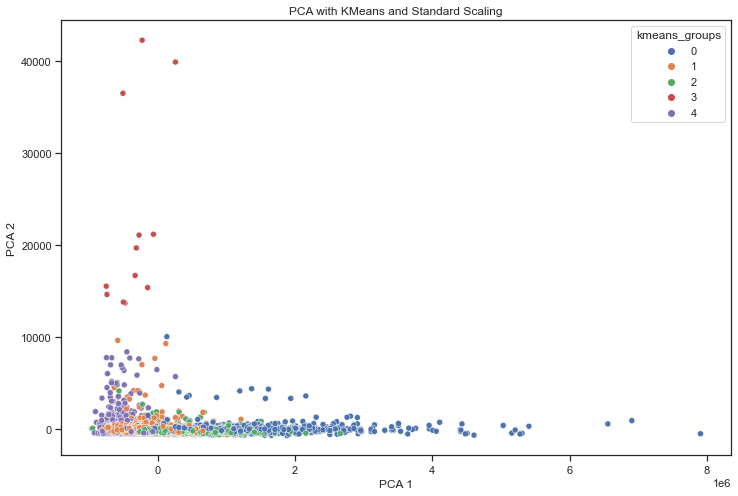

In [26]:
# perform PCA on grouping parameters
pca = PCA(n_components=2)
principalComponents_kmeans_stdscaler = pca.fit_transform(kmeans_standard_scaler)

sns.scatterplot(principalComponents_kmeans_stdscaler[:,0], 
                principalComponents_kmeans_stdscaler[:,1],
               hue = kmeans_standard_scaler['kmeans_groups'],
                legend = 'full', palette = 'deep').set(title =
                                                      'PCA with KMeans and Standard Scaling',
                                                      xlabel = 'PCA 1', ylabel = 'PCA 2');

## Using hierarchical clustering with standardscaler

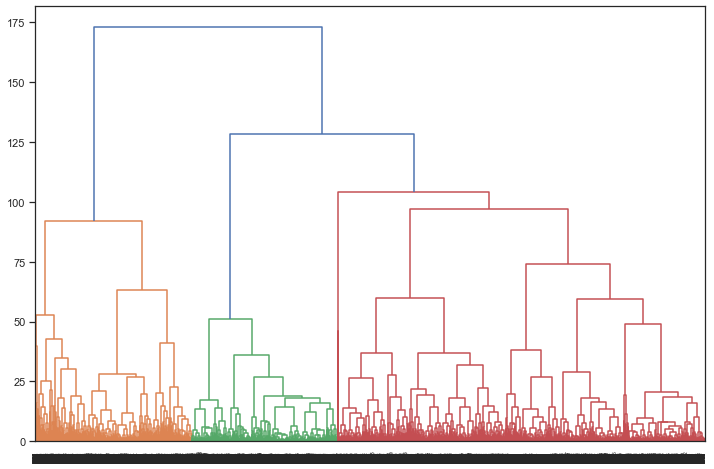

In [28]:
Dendrogram = shc.dendrogram((shc.linkage(scaled_data, 
                                        method = 'ward')))

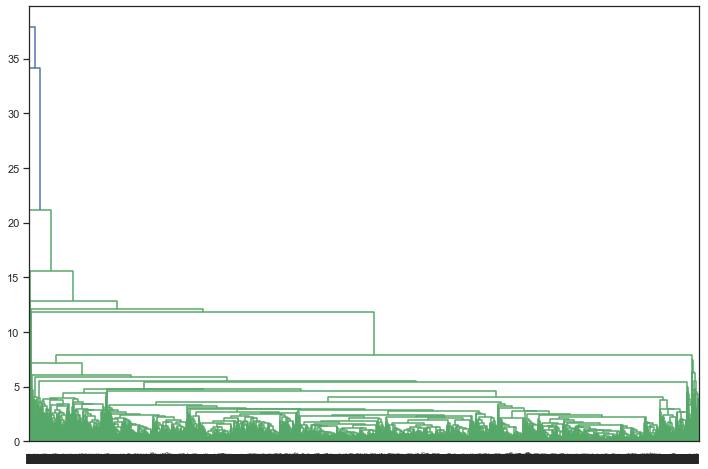

In [29]:
Dendrogram = shc.dendrogram((shc.linkage(scaled_data, 
                                        method = 'average')))

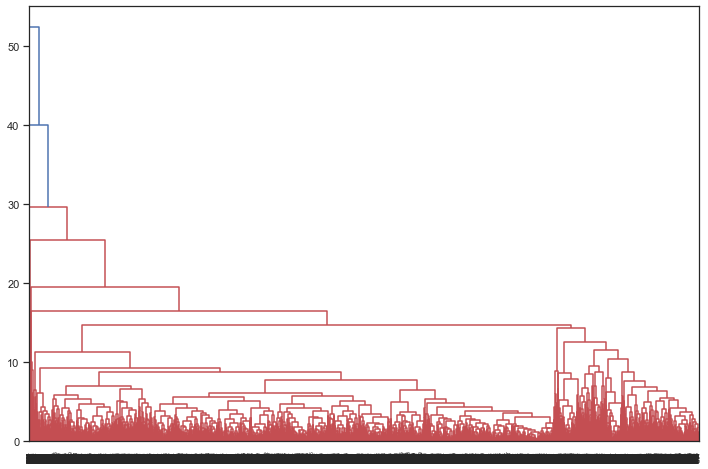

In [30]:
Dendrogram = shc.dendrogram((shc.linkage(scaled_data, 
                                        method = 'complete')))

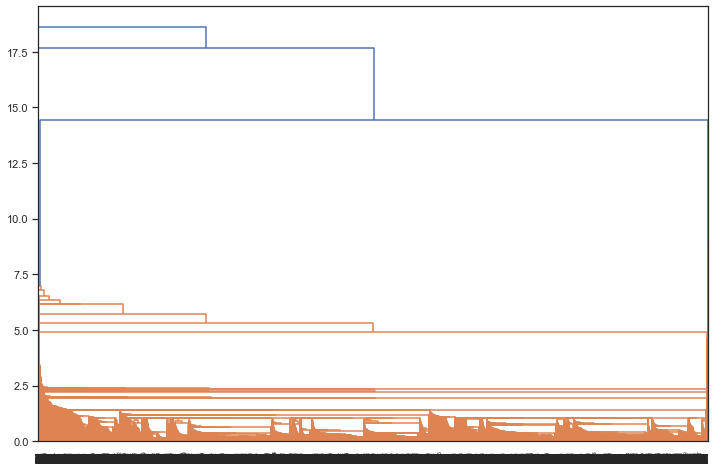

In [31]:
Dendrogram = shc.dendrogram((shc.linkage(scaled_data, 
                                        method = 'single')))

In [27]:
# in terms of hierarchical clustering, the ward linkage is the best
agg_cluster_stdscaler = AgglomerativeClustering(linkage = 'ward').fit_predict(scaled_data)

In [28]:
# creating a new column to variables with kmeans
aggclust_standard_scaler = all_data.copy()
aggclust_standard_scaler['hierarch_groups'] = agg_cluster_stdscaler
aggclust_standard_scaler.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,hierarch_groups
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",0


In [34]:
len(aggclust_standard_scaler)

8887

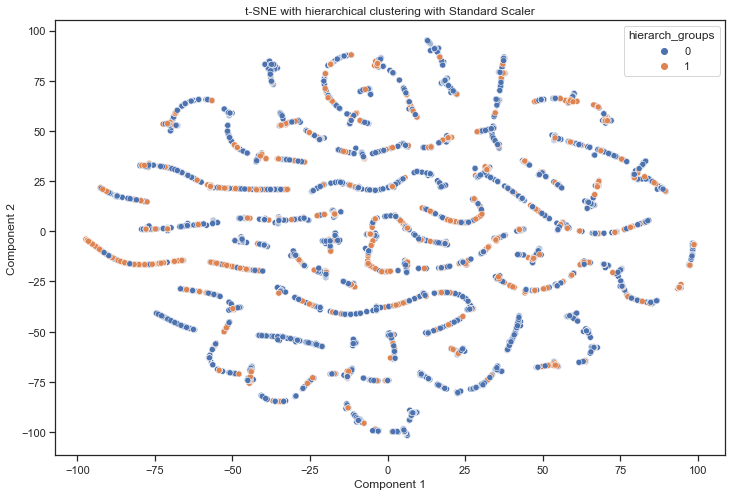

In [31]:
# perform t-SNE on grouping parameters
tsne = TSNE()
X_stdscaler_hierarch = tsne.fit_transform(aggclust_standard_scaler)

sns.scatterplot(X_stdscaler_hierarch[:,0], X_stdscaler_hierarch[:,1],
               hue = aggclust_standard_scaler['hierarch_groups'],
                legend = 'full').set(title = 't-SNE with hierarchical clustering with Standard Scaler',
                                    xlabel = 'Component 1', ylabel = 'Component 2');

<AxesSubplot:>

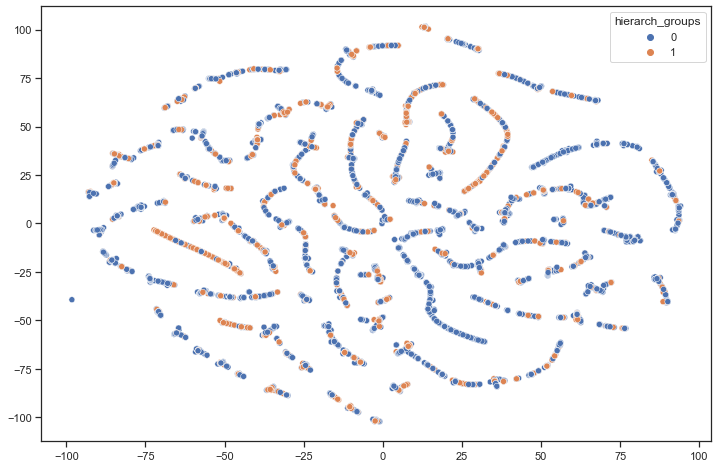

In [36]:
TSNE(n_components=2, perplexity=30.0, verbose=0)
X_stdscaler_hierarch = tsne.fit_transform(aggclust_standard_scaler)

sns.scatterplot(X_stdscaler_hierarch[:,0], X_stdscaler_hierarch[:,1],
               hue = aggclust_standard_scaler['hierarch_groups'],
                legend = 'full')

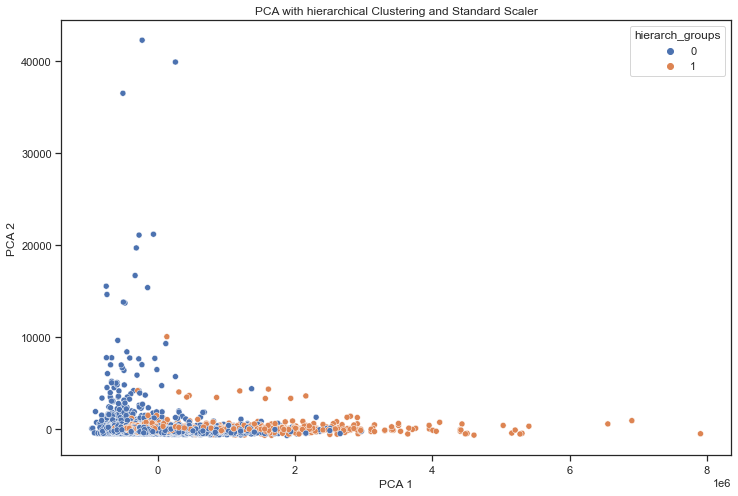

In [32]:
# perform PCA on grouping parameters
pca = PCA(n_components=2)
principalComponents_hierarch_stdscaler = pca.fit_transform(aggclust_standard_scaler)

sns.scatterplot(principalComponents_hierarch_stdscaler[:,0], 
                principalComponents_hierarch_stdscaler[:,1],
               hue = aggclust_standard_scaler['hierarch_groups'],
                legend = 'full').set(title = 'PCA with hierarchical Clustering and Standard Scaler',
                                    xlabel = 'PCA 1', ylabel = 'PCA 2');

## Preparing data for analysis with robustscaler

In [38]:
# scaling the dataset
robust_scaler_1 = RobustScaler()
robust_data = robust_scaler_1.fit(all_data).transform(all_data)
robust_data[1]

# https://stats.stackexchange.com/questions/483187/difference-between-log-transformation-and-standardization

array([ 0.        ,  0.80255682, -1.02666667,  0.        ,  0.        ,
       -2.        , -0.78181818,  0.225     , -1.27272727])

In [39]:
len(robust_data)

8887

## Using KMeans with robustscaler

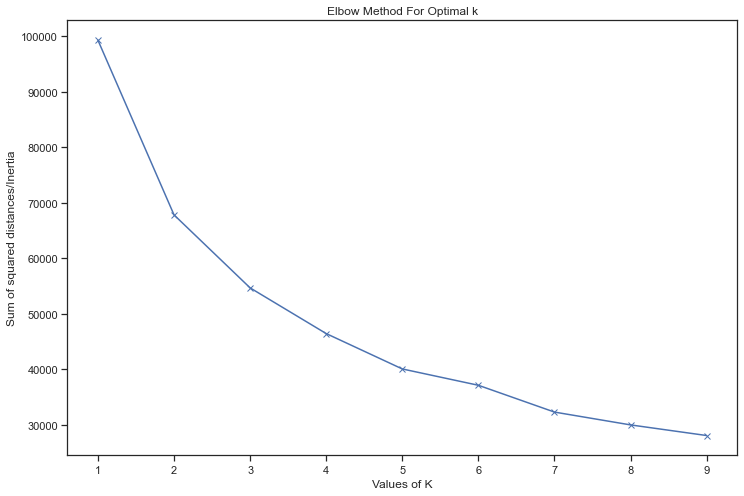

In [40]:
#elbow method to determine number of clusters
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(robust_data)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

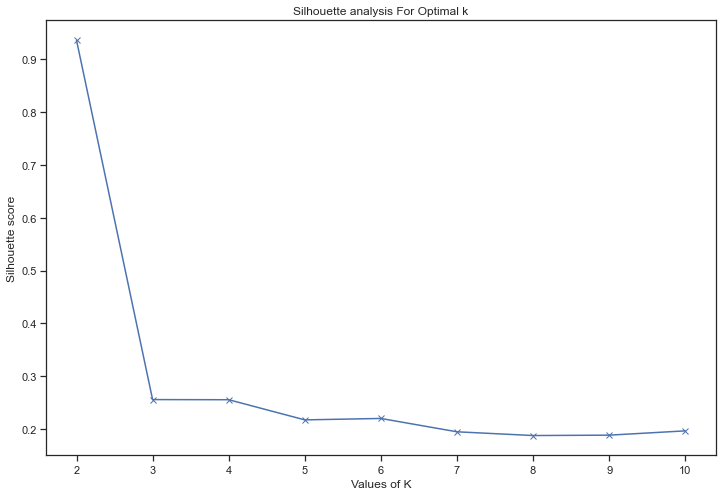

In [41]:
#Silhouette analysis for optimal k

from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
silhouette_avg = []
for num_clusters in range_n_clusters:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(robust_data)
 cluster_labels = kmeans.labels_
 
 # silhouette score
 silhouette_avg.append(silhouette_score(robust_data, cluster_labels))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [42]:
# from the KMeans analysis it appears that number of clusters = 4 is the best
kmeans_robust = KMeans(n_clusters = 4, random_state = 0).fit_predict(robust_data)

In [43]:
# creating a new column to variables with kmeans
kmeans_robust_scaler = all_data.copy()
kmeans_robust_scaler['kmeans_groups'] = kmeans_robust
kmeans_robust_scaler.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",3
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",3
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",3
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",3
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",3


In [44]:
len(kmeans_robust_scaler)

8887

<AxesSubplot:>

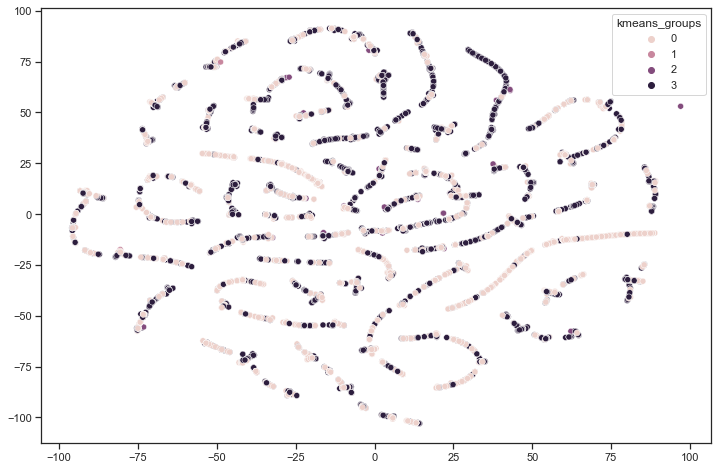

In [45]:
# perform t-SNE on grouping parameters
tsne = TSNE()
X_robustscaler_kmeans = tsne.fit_transform(kmeans_robust_scaler)

sns.scatterplot(X_robustscaler_kmeans[:,0], X_robustscaler_kmeans[:,1],
               hue = kmeans_robust_scaler['kmeans_groups'],
                legend = 'full')

<AxesSubplot:>

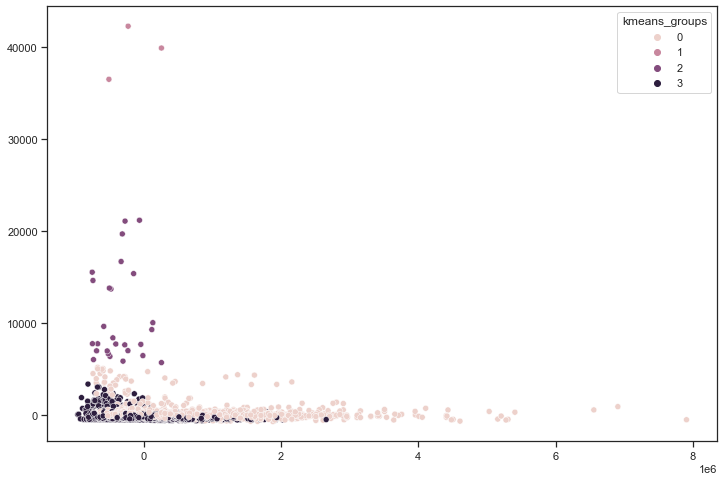

In [46]:
# perform PCA on grouping parameters
pca = PCA(n_components=2)
principalComponents_kmeans_robustscaler = pca.fit_transform(kmeans_robust_scaler)

sns.scatterplot(principalComponents_kmeans_robustscaler[:,0], 
                principalComponents_kmeans_robustscaler[:,1],
               hue = kmeans_robust_scaler['kmeans_groups'],
                legend = 'full')

## Using hierarchical clustering with robustscaler

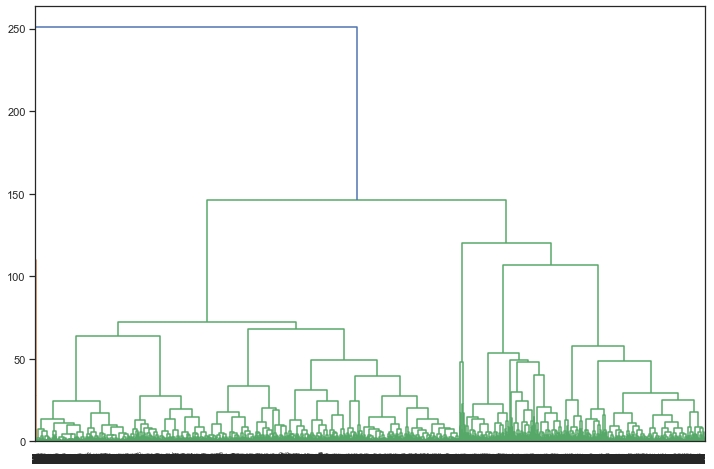

In [47]:
Dendrogram = shc.dendrogram((shc.linkage(robust_data, 
                                        method = 'ward')))

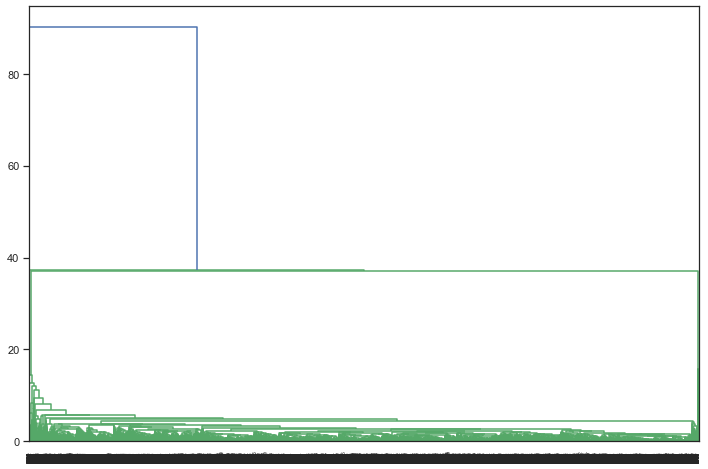

In [48]:
Dendrogram = shc.dendrogram((shc.linkage(robust_data, 
                                        method = 'average')))

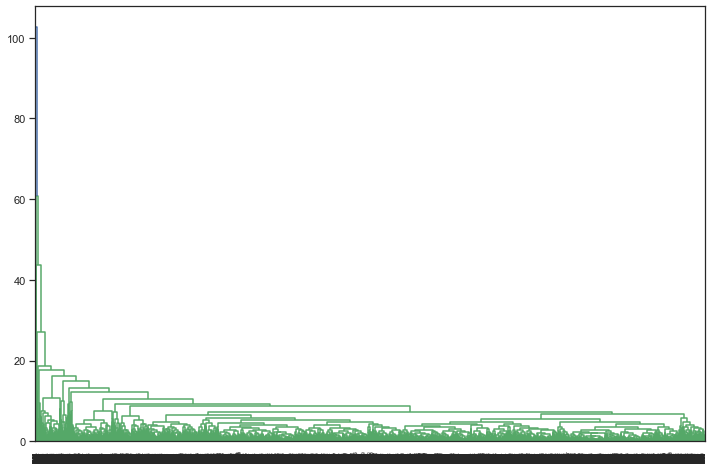

In [49]:
Dendrogram = shc.dendrogram((shc.linkage(robust_data, 
                                        method = 'complete')))

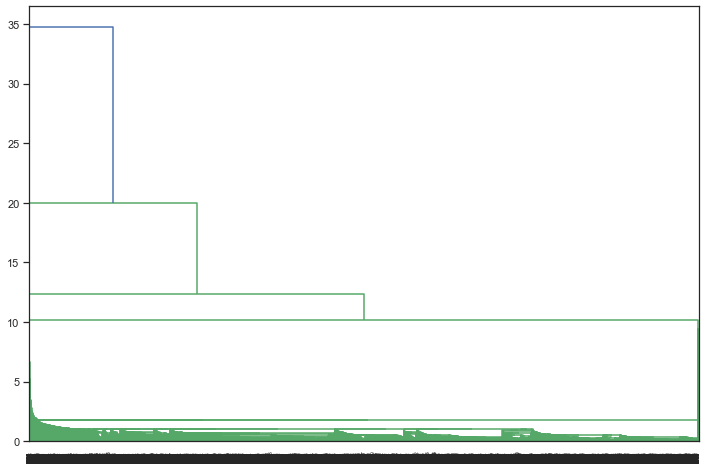

In [50]:
Dendrogram = shc.dendrogram((shc.linkage(robust_data, 
                                        method = 'single')))

In [51]:
# in terms of hierarchical clustering, the ward linkage is the best
agg_cluster_robustscaler = AgglomerativeClustering(linkage = 'ward').fit_predict(robust_data)

In [52]:
# creating a new column to variables with kmeans
aggclust_robust_scaler = all_data.copy()
aggclust_robust_scaler['hierarch_groups'] = agg_cluster_robustscaler
aggclust_robust_scaler.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,hierarch_groups
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",0


In [53]:
len(aggclust_robust_scaler)

8887

<AxesSubplot:>

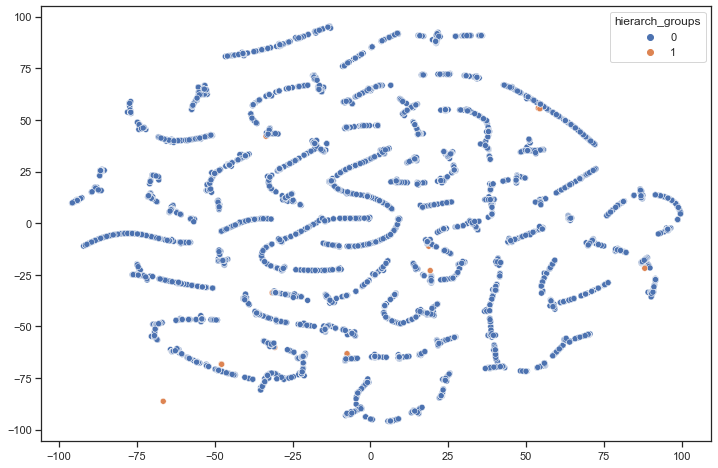

In [54]:
# perform t-SNE on grouping parameters
tsne = TSNE()
X_robustscaler_hierarch = tsne.fit_transform(aggclust_robust_scaler)

sns.scatterplot(X_robustscaler_hierarch[:,0], X_robustscaler_hierarch[:,1],
               hue = aggclust_robust_scaler['hierarch_groups'],
                legend = 'full')

<AxesSubplot:>

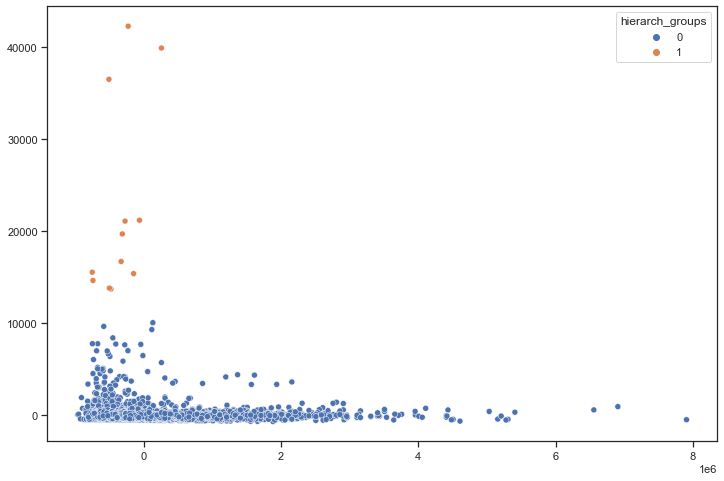

In [55]:
# perform PCA on grouping parameters
pca = PCA(n_components=2)
principalComponents_hierarch_robustscaler = pca.fit_transform(aggclust_robust_scaler)

sns.scatterplot(principalComponents_hierarch_robustscaler[:,0], 
                principalComponents_hierarch_robustscaler[:,1],
               hue = aggclust_robust_scaler['hierarch_groups'],
                legend = 'full')

## Conclusion EDA

In [56]:
# Count how many of each property type
data.groupby('Type').count()

,Suburb,Address,Rooms,Price,Method,SellerG,Date,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
Type,,,,,,,,,,,,,,,,,,,,
h,23980,23980,23980,18472,23980,23980,23980,23979,23979,20422,20416,19932,17694,10413,11453,23978,20540,20540,23978,23978
t,3580,3580,3580,2866,3580,3580,3580,3580,3580,1945,1943,1941,1611,1132,1276,3580,1978,1978,3580,3580
u,7297,7297,7297,5909,7297,7297,7297,7297,7297,4273,4272,4256,3742,2197,2822,7296,4363,4363,7296,7296


# now what about counts for the four models created. How does 'Type' compare?

In [57]:
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.50,"3,067.00",...,1.00,1.00,126.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
1,Abbotsford,85 Turner St,2,h,"1,480,000.00",S,Biggin,3/12/2016,2.50,"3,067.00",...,1.00,1.00,202.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
2,Abbotsford,25 Bloomburg St,2,h,"1,035,000.00",S,Biggin,4/02/2016,2.50,"3,067.00",...,1.00,0.00,156.00,79.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.50,"3,067.00",...,2.00,1.00,0.00,NaN,NaN,Yarra City Council,-37.81,145.01,Northern Metropolitan,"4,019.00"
4,Abbotsford,5 Charles St,3,h,"1,465,000.00",SP,Biggin,4/03/2017,2.50,"3,067.00",...,2.00,0.00,134.00,150.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"


In [58]:
additional_data

,Type,Suburb,Longtitude,Lattitude,Propertycount
0,h,Abbotsford,144.99,-37.81,"4,019.00"
1,h,Abbotsford,144.99,-37.81,"4,019.00"
2,h,Abbotsford,144.99,-37.81,"4,019.00"
3,h,Abbotsford,145.00,-37.80,"4,019.00"
4,h,Abbotsford,145.00,-37.81,"4,019.00"
...,...,...,...,...,...
8882,h,Wollert,145.04,-37.62,"2,940.00"
8883,h,Wollert,145.03,-37.61,"2,940.00"
8884,h,Yarraville,144.89,-37.82,"6,543.00"
8885,t,Yarraville,144.88,-37.82,"6,543.00"


In [59]:
additional_data.groupby(['Type']).count()

,Suburb,Longtitude,Lattitude,Propertycount
Type,,,,
h,6625,6625,6625,6625
t,722,722,722,722
u,1540,1540,1540,1540


## KMeans StandardScaler

In [34]:
# KMeans Standard Scaler

# importing Type and other data back in
kmeans_standard_scaler_withtype = pd.concat([kmeans_standard_scaler, 
                                             additional_data], axis =1)
# dummy code Type
Type_names = pd.get_dummies(kmeans_standard_scaler_withtype['Type'])
kmeans_standard_scaler_withtype[['h','u','t']] = Type_names
kmeans_standard_scaler_withtype = kmeans_standard_scaler_withtype.drop('Type',axis=1)
kmeans_standard_scaler_withtype.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",1,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",2,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",2,Abbotsford,145.00,-37.81,"4,019.00",1,0,0


In [35]:
# cluster vs Type
pd.set_option("display.max_rows", kmeans_standard_scaler_withtype.index.shape[0])
kmeans_standard_scaler_withtype.groupby(['kmeans_groups'])['h','u','t'].sum()

,h,u,t
kmeans_groups,,,
0,"1,420.00",50.00,7.00
1,"2,763.00",419.00,158.00
2,"2,006.00",24.00,72.00
3,4.00,1.00,7.00
4,432.00,228.00,"1,296.00"


In [62]:
kmeans_standard_scaler_withtype.groupby(['kmeans_groups', 'Suburb'])['Propertycount'].sum()

kmeans_groups  Suburb            
0              Aberfeldie              15,430.00
               Airport West            17,320.00
               Albert Park             13,120.00
               Alphington              15,477.00
               Altona                  15,903.00
               Altona North            15,396.00
               Armadale                48,360.00
               Ascot Vale              78,804.00
               Ashburton               64,092.00
               Ashwood                 23,152.00
               Avondale Heights        18,008.00
               Balwyn                 198,870.00
               Balwyn North           507,585.00
               Bayswater                5,030.00
               Beaumaris               59,026.00
               Bentleigh              197,055.00
               Bentleigh East         219,380.00
               Berwick                 34,186.00
               Black Rock               5,732.00
               Blackburn           

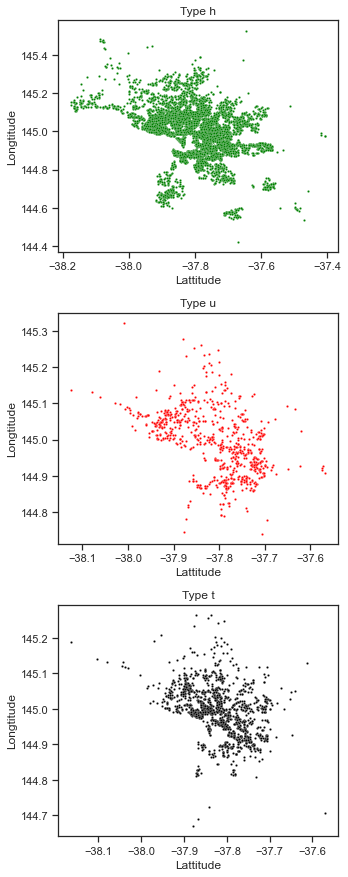

In [45]:
fig, ax = plt.subplots(figsize = (5,20));
ax = plt.subplot(5,1,1)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['h']==1], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['h']==1],
                s = 5, color = 'green').set(title = 'Type h');
ax = plt.subplot(5,1,2)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['u']==1], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['u']==1],
                s = 5, color = 'red').set(title = 'Type u');
ax = plt.subplot(5,1,3)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['t']==1], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['t']==1],
                s = 5, color = 'black').set(title = 'Type t');
fig.tight_layout()
plt.show();

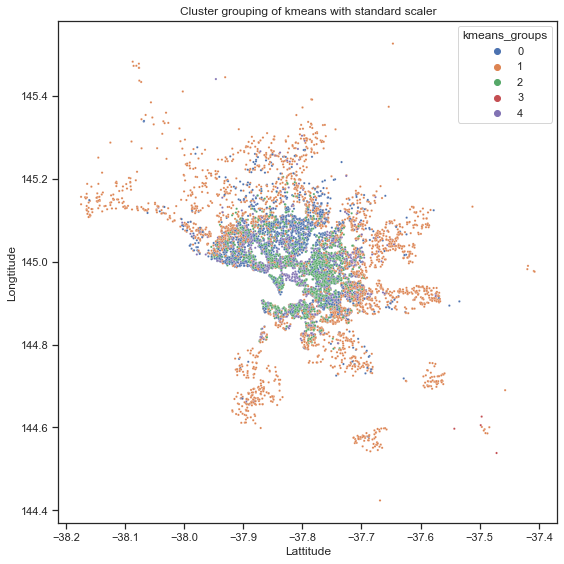

In [51]:
fig, ax = plt.subplots(figsize = (8,8));
sns.scatterplot('Lattitude', 'Longtitude',
                hue = 'kmeans_groups', s = 5,
                 data = kmeans_standard_scaler_withtype,
               palette = 'deep').set(title = 'Cluster grouping of kmeans with standard scaler');
fig.tight_layout()
plt.show();

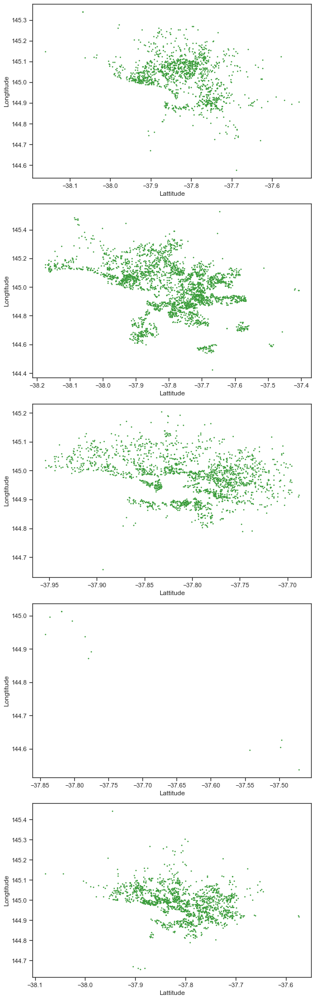

In [65]:
fig, ax = plt.subplots(figsize = (8,25));
ax = plt.subplot(5,1,1)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['kmeans_groups']==0], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['kmeans_groups']==0],
                s = 5, color = 'green');
ax = plt.subplot(5,1,2)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['kmeans_groups']==1], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['kmeans_groups']==1],
                s = 5, color = 'green');
ax = plt.subplot(5,1,3)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['kmeans_groups']==2], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['kmeans_groups']==2],
                s = 5, color = 'green');
ax = plt.subplot(5,1,4)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['kmeans_groups']==3], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['kmeans_groups']==3],
                s = 5, color = 'green');
ax = plt.subplot(5,1,5)
sns.scatterplot(kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['kmeans_groups']==4], 
                kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['kmeans_groups']==4],
                s = 5, color = 'green');
fig.tight_layout()
plt.show();

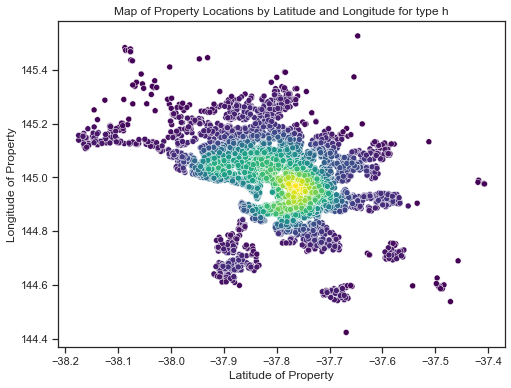

In [46]:
# Density scatterplot: locations of properties by longitude and latitude
data_na = data.dropna()
values = np.stack([kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['h'] == 1], 
                   kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['h'] == 1]])
kernel = stats.gaussian_kde(values)(values)

fix, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(
    x=kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['h'] == 1], 
    y=kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['h'] == 1],  
                     c=kernel, cmap='viridis', ax=ax)
# Add title and axis names
plt.title('Map of Property Locations by Latitude and Longitude for type h')
plt.xlabel('Latitude of Property')
plt.ylabel('Longitude of Property')
plt.show();

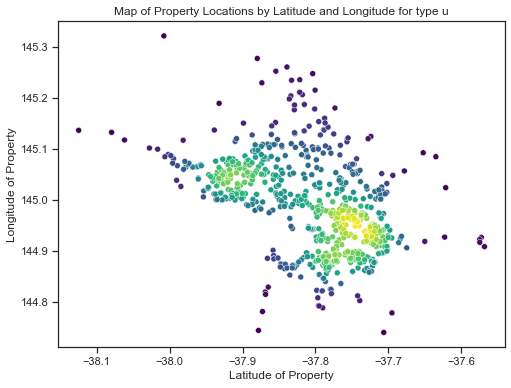

In [50]:
# Density scatterplot: locations of properties by longitude and latitude
data_na = data.dropna()
values = np.stack([kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['u'] == 1], 
                   kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['u'] == 1]])
kernel = stats.gaussian_kde(values)(values)

fix, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(
    x=kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['u'] == 1], 
    y=kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['u'] == 1],  
                     c=kernel, cmap='viridis', ax=ax)
# Add title and axis names
plt.title('Map of Property Locations by Latitude and Longitude for type u')
plt.xlabel('Latitude of Property')
plt.ylabel('Longitude of Property')
plt.show();

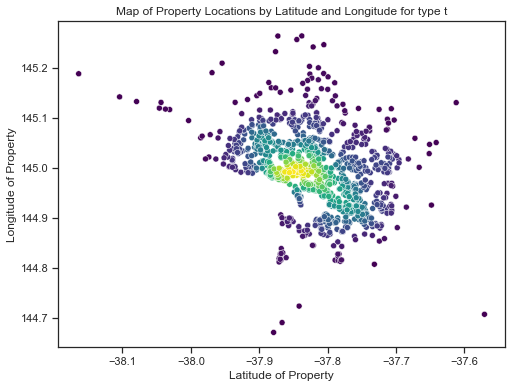

In [48]:
# Density scatterplot: locations of properties by longitude and latitude
data_na = data.dropna()
values = np.stack([kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['t'] == 1], 
                   kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['t'] == 1]])
kernel = stats.gaussian_kde(values)(values)

fix, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(
    x=kmeans_standard_scaler_withtype['Lattitude'][kmeans_standard_scaler_withtype['t'] == 1], 
    y=kmeans_standard_scaler_withtype['Longtitude'][kmeans_standard_scaler_withtype['t'] == 1],  
                     c=kernel, cmap='viridis', ax=ax)
# Add title and axis names
plt.title('Map of Property Locations by Latitude and Longitude for type t')
plt.xlabel('Latitude of Property')
plt.ylabel('Longitude of Property')
plt.show();

## Hierarchical StandardScaler

In [69]:
# importing Type back in
aggclust_standard_scaler_withtype = pd.concat([aggclust_standard_scaler, 
                                             additional_data], axis =1)
# dummy code Type
Type_names_2 = pd.get_dummies(aggclust_standard_scaler_withtype['Type'])
aggclust_standard_scaler_withtype[['h','u','t']] = Type_names_2
aggclust_standard_scaler_withtype = aggclust_standard_scaler_withtype.drop('Type',axis=1)
aggclust_standard_scaler_withtype.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,hierarch_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",0,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",0,Abbotsford,145.00,-37.81,"4,019.00",1,0,0


In [70]:
# cluster vs Type
aggclust_standard_scaler_withtype.groupby(['hierarch_groups'])['h','u','t'].sum()

,h,u,t
hierarch_groups,,,
0,"4,656.00",622.00,"1,526.00"
1,"1,969.00",100.00,14.00


In [71]:
aggclust_standard_scaler_withtype.groupby(['hierarch_groups', 'Suburb'])['Propertycount'].sum()

hierarch_groups  Suburb            
0                Abbotsford             156,741.00
                 Aberfeldie              35,489.00
                 Airport West           148,952.00
                 Albanvale                3,798.00
                 Albert Park             98,400.00
                 Albion                  50,255.00
                 Alphington              33,165.00
                 Altona                 148,428.00
                 Altona Meadows          30,520.00
                 Altona North            92,376.00
                 Ardeer                   3,843.00
                 Armadale               198,276.00
                 Ascot Vale             518,793.00
                 Ashburton               76,300.00
                 Ashwood                 75,244.00
                 Aspendale               11,296.00
                 Aspendale Gardens        2,243.00
                 Attwood                  1,130.00
                 Avondale Heights       135,06

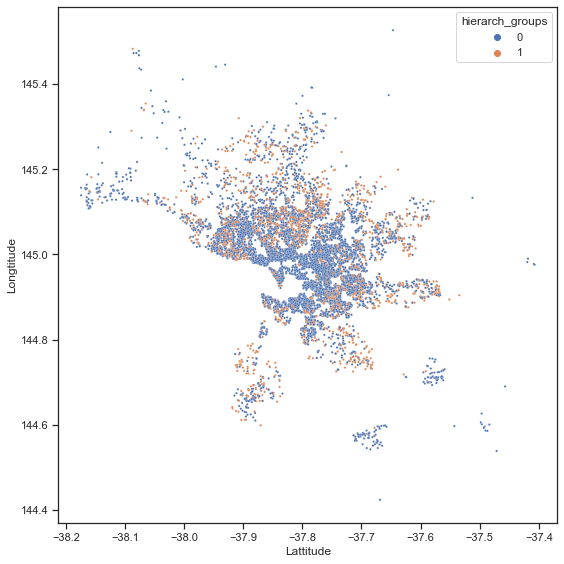

In [72]:
fig, ax = plt.subplots(figsize = (8,8));
sns.scatterplot('Lattitude', 'Longtitude',
                hue = 'hierarch_groups', s = 5,
                 data = aggclust_standard_scaler_withtype);
fig.tight_layout()
plt.show();

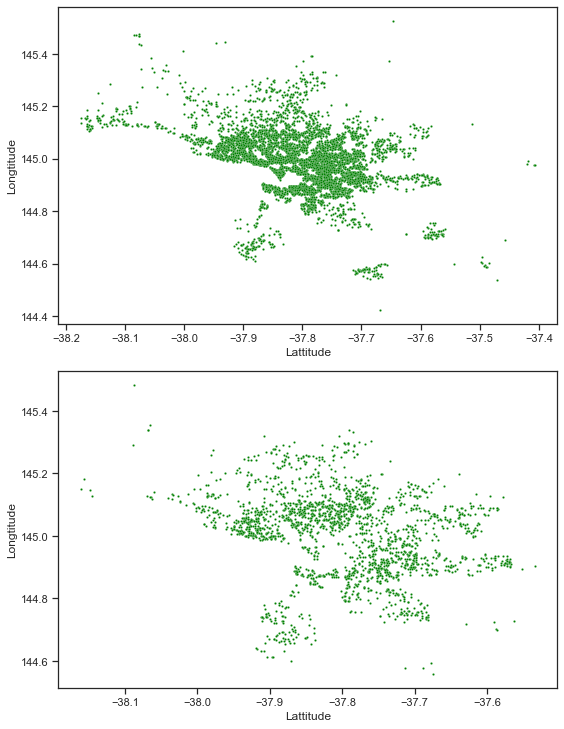

In [73]:
fig, ax = plt.subplots(figsize = (8,25));
ax = plt.subplot(5,1,1)
sns.scatterplot(aggclust_standard_scaler_withtype['Lattitude'][aggclust_standard_scaler_withtype['hierarch_groups']==0], 
                aggclust_standard_scaler_withtype['Longtitude'][aggclust_standard_scaler_withtype['hierarch_groups']==0],
                s = 5, color = 'green');
ax = plt.subplot(5,1,2)
sns.scatterplot(aggclust_standard_scaler_withtype['Lattitude'][aggclust_standard_scaler_withtype['hierarch_groups']==1], 
                aggclust_standard_scaler_withtype['Longtitude'][aggclust_standard_scaler_withtype['hierarch_groups']==1],
                s = 5, color = 'green');
fig.tight_layout()
plt.show();

## KMeans Robust Scaler

In [74]:
# importing Type back in
kmeans_robust_scaler_withtype = pd.concat([kmeans_robust_scaler, 
                                             additional_data], axis =1)
# dummy code Type
Type_names_3 = pd.get_dummies(kmeans_robust_scaler_withtype['Type'])
kmeans_robust_scaler_withtype[['h','u','t']] = Type_names_3
kmeans_robust_scaler_withtype = kmeans_robust_scaler_withtype.drop('Type',axis=1)
kmeans_robust_scaler_withtype.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",3,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",3,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",3,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",3,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",3,Abbotsford,145.00,-37.81,"4,019.00",1,0,0


In [75]:
# cluster vs Type
kmeans_robust_scaler_withtype.groupby(['kmeans_groups'])['h','u','t'].sum()

,h,u,t
kmeans_groups,,,
0,"3,278.00",169.00,44.00
1,2.00,0.00,1.00
2,6.00,2.00,19.00
3,"3,339.00",551.00,"1,476.00"


In [76]:
kmeans_robust_scaler_withtype.groupby(['kmeans_groups', 'Suburb'])['Propertycount'].sum()

kmeans_groups  Suburb            
0              Abbotsford               4,019.00
               Aberfeldie              23,145.00
               Airport West            38,104.00
               Albert Park             16,400.00
               Albion                   8,740.00
               Alphington              19,899.00
               Altona                  31,806.00
               Altona Meadows          61,040.00
               Altona North            61,584.00
               Ardeer                   3,843.00
               Armadale                72,540.00
               Ascot Vale             137,907.00
               Ashburton              106,820.00
               Ashwood                 49,198.00
               Aspendale                8,472.00
               Aspendale Gardens        2,243.00
               Attwood                  5,650.00
               Avondale Heights        49,522.00
               Bacchus Marsh            2,871.00
               Balaclava           

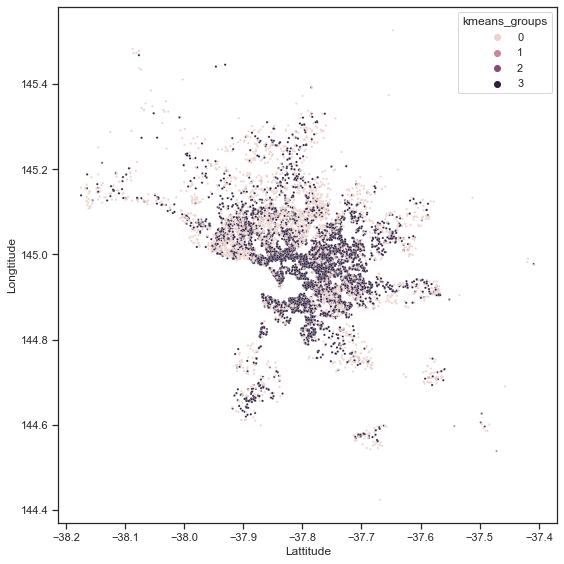

In [77]:
fig, ax = plt.subplots(figsize = (8,8));
sns.scatterplot('Lattitude', 'Longtitude',
                hue = 'kmeans_groups', s = 5,
                 data = kmeans_robust_scaler_withtype);
fig.tight_layout()
plt.show();

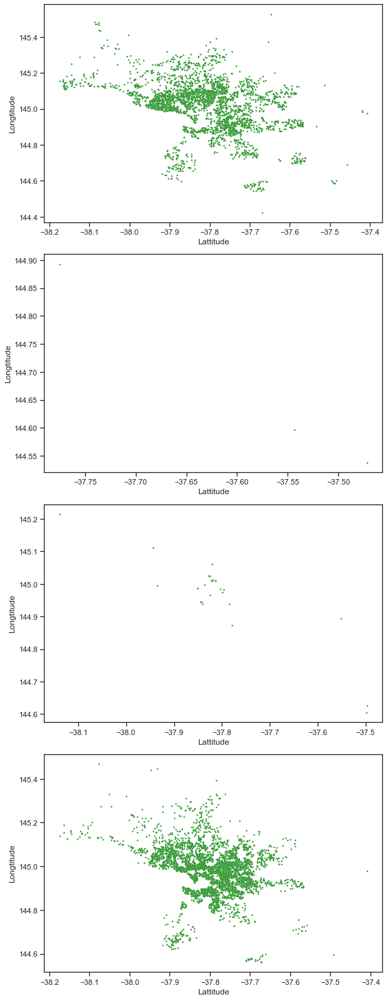

In [78]:
fig, ax = plt.subplots(figsize = (8,25));
ax = plt.subplot(5,1,1)
sns.scatterplot(kmeans_robust_scaler_withtype['Lattitude'][kmeans_robust_scaler_withtype['kmeans_groups']==0], 
                kmeans_robust_scaler_withtype['Longtitude'][kmeans_robust_scaler_withtype['kmeans_groups']==0],
                s = 5, color = 'green');
ax = plt.subplot(5,1,2)
sns.scatterplot(kmeans_robust_scaler_withtype['Lattitude'][kmeans_robust_scaler_withtype['kmeans_groups']==1], 
                kmeans_robust_scaler_withtype['Longtitude'][kmeans_robust_scaler_withtype['kmeans_groups']==1],
                s = 5, color = 'green');
ax = plt.subplot(5,1,3)
sns.scatterplot(kmeans_robust_scaler_withtype['Lattitude'][kmeans_robust_scaler_withtype['kmeans_groups']==2], 
                kmeans_robust_scaler_withtype['Longtitude'][kmeans_robust_scaler_withtype['kmeans_groups']==2],
                s = 5, color = 'green');
ax = plt.subplot(5,1,4)
sns.scatterplot(kmeans_robust_scaler_withtype['Lattitude'][kmeans_robust_scaler_withtype['kmeans_groups']==3], 
                kmeans_robust_scaler_withtype['Longtitude'][kmeans_robust_scaler_withtype['kmeans_groups']==3],
                s = 5, color = 'green');
fig.tight_layout()
plt.show();

## Hierarchical cluster RobustScaler

In [79]:
# importing Type back in
aggclust_robust_scaler_withtype = pd.concat([aggclust_robust_scaler, 
                                             additional_data], axis =1)
# dummy code Type
Type_names_4 = pd.get_dummies(aggclust_robust_scaler_withtype['Type'])
aggclust_robust_scaler_withtype[['h','u','t']] = Type_names_4
aggclust_robust_scaler_withtype = aggclust_robust_scaler_withtype.drop('Type',axis=1)
aggclust_robust_scaler_withtype.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,hierarch_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",0,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",0,Abbotsford,145.00,-37.81,"4,019.00",1,0,0


In [80]:
# cluster vs Type
aggclust_robust_scaler_withtype.groupby(['hierarch_groups'])['h','u','t'].sum()

,h,u,t
hierarch_groups,,,
0,"6,621.00",721.00,"1,533.00"
1,4.00,1.00,7.00


In [81]:
aggclust_robust_scaler_withtype.groupby(['hierarch_groups', 'Suburb'])['Propertycount'].sum()

hierarch_groups  Suburb            
0                Abbotsford             156,741.00
                 Aberfeldie              44,747.00
                 Airport West           180,128.00
                 Albanvale                5,697.00
                 Albert Park            111,520.00
                 Albion                  58,995.00
                 Alphington              39,798.00
                 Altona                 180,234.00
                 Altona Meadows          91,560.00
                 Altona North           169,356.00
                 Ardeer                   7,686.00
                 Armadale               236,964.00
                 Ascot Vale             584,463.00
                 Ashburton              128,184.00
                 Ashwood                 98,396.00
                 Aspendale               19,768.00
                 Aspendale Gardens        4,486.00
                 Attwood                  6,780.00
                 Avondale Heights       175,57

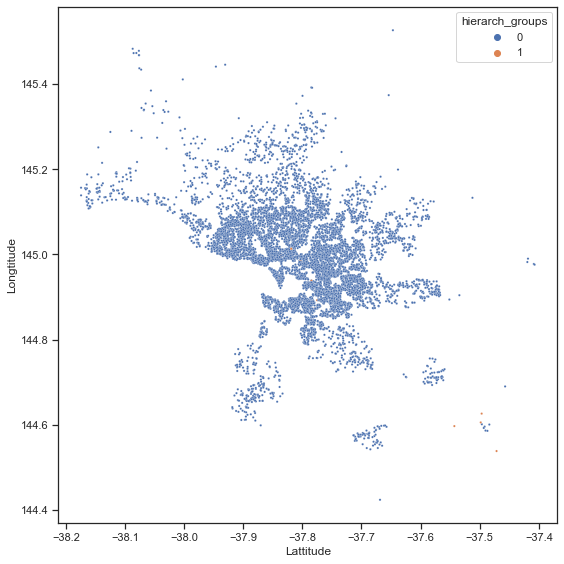

In [82]:
fig, ax = plt.subplots(figsize = (8,8));
sns.scatterplot('Lattitude', 'Longtitude',
                hue = 'hierarch_groups', s = 5,
                 data = aggclust_robust_scaler_withtype);
fig.tight_layout()
plt.show();

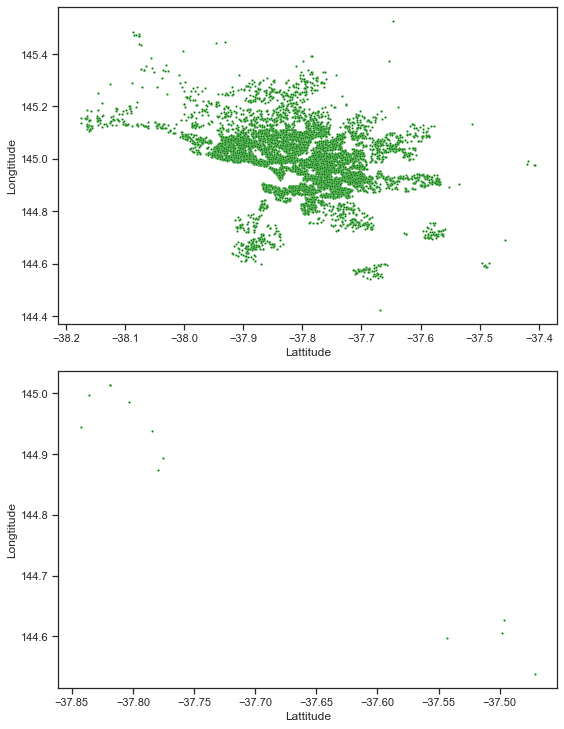

In [83]:
fig, ax = plt.subplots(figsize = (8,25));
ax = plt.subplot(5,1,1)
sns.scatterplot(aggclust_robust_scaler_withtype['Lattitude'][aggclust_robust_scaler_withtype['hierarch_groups']==0], 
                aggclust_robust_scaler_withtype['Longtitude'][aggclust_robust_scaler_withtype['hierarch_groups']==0],
                s = 5, color = 'green');
ax = plt.subplot(5,1,2)
sns.scatterplot(aggclust_robust_scaler_withtype['Lattitude'][aggclust_robust_scaler_withtype['hierarch_groups']==1], 
                aggclust_robust_scaler_withtype['Longtitude'][aggclust_robust_scaler_withtype['hierarch_groups']==1],
                s = 5, color = 'green');
fig.tight_layout()
plt.show();

In [84]:
# as kmeans group is the best, let's look at property/houses for each 
# clusters in that group
kmeans_standard_scaler_withtype

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",1,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",2,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,2,"1,636,000.00",2.50,2.00,1.00,2.00,256.00,107.00,"1,890.00",2,Abbotsford,145.00,-37.81,"4,019.00",1,0,0
5,2,"1,097,000.00",2.50,3.00,1.00,2.00,220.00,75.00,"1,900.00",2,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
6,3,"1,350,000.00",2.50,3.00,2.00,2.00,214.00,190.00,"2,005.00",1,Abbotsford,145.00,-37.81,"4,019.00",1,0,0
7,2,"750,000.00",2.50,2.00,2.00,1.00,0.00,94.00,"2,009.00",4,Abbotsford,145.00,-37.81,"4,019.00",0,0,1
8,2,"1,310,000.00",2.50,2.00,1.00,2.00,238.00,97.00,"1,890.00",2,Abbotsford,145.00,-37.81,"4,019.00",1,0,0
9,3,"1,200,000.00",2.50,3.00,2.00,1.00,113.00,110.00,"1,880.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0


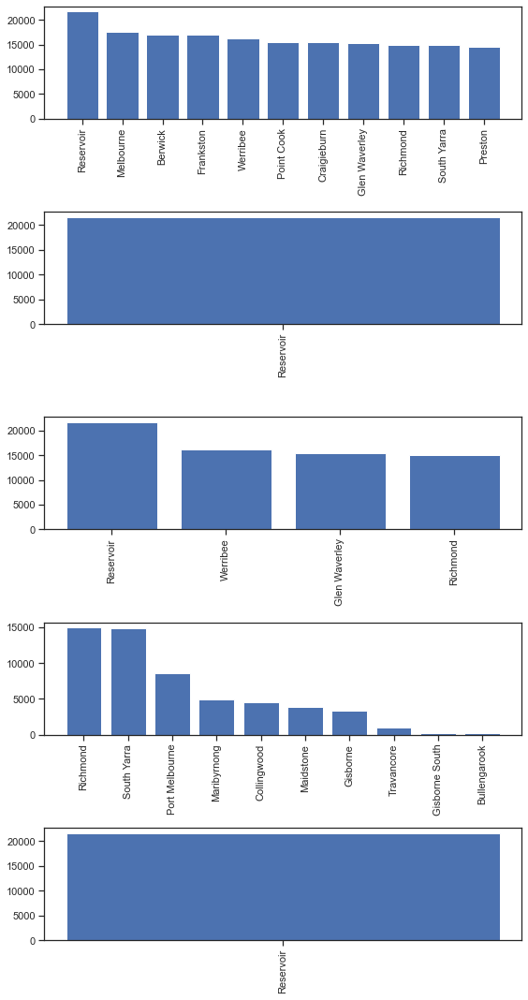

In [85]:
fig, ax = plt.subplots(figsize = (8,15));
for group in kmeans_standard_scaler_withtype['kmeans_groups'].unique():
    data_clusters = kmeans_standard_scaler_withtype[kmeans_standard_scaler_withtype['kmeans_groups'] == group]
    # pick 15 largest suburb populations
    data_sorted=data_clusters.sort_values(by=['Propertycount'],ascending=False)[0:50]
    # plot results
    ax = plt.subplot(5,1,group+1) 
    plt.bar(data_sorted['Suburb'], data_sorted['Propertycount'])
    plt.xticks(rotation=90)
    plt.tight_layout()
plt.show()

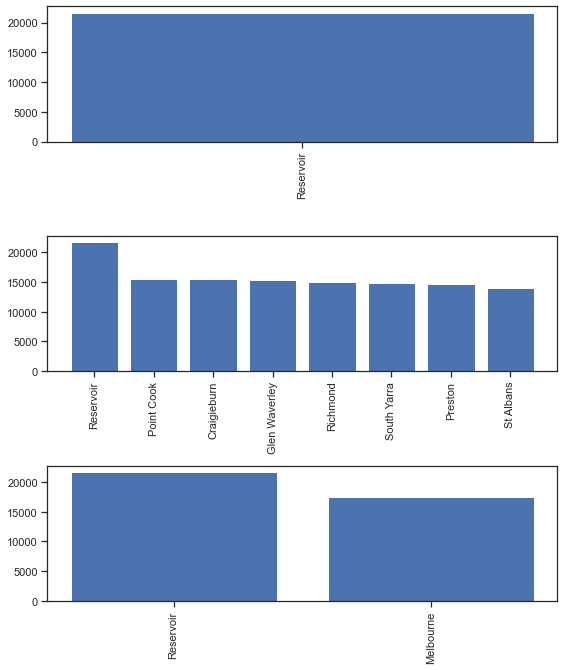

In [86]:
fig, ax = plt.subplots(figsize = (8,15));
data_h = kmeans_standard_scaler_withtype[kmeans_standard_scaler_withtype['h'] == 1]
data_h=data_h.sort_values(by=['Propertycount'],ascending=False)[0:50]

data_u = kmeans_standard_scaler_withtype[kmeans_standard_scaler_withtype['u'] == 1]
data_u=data_u.sort_values(by=['Propertycount'],ascending=False)[0:50]

data_t = kmeans_standard_scaler_withtype[kmeans_standard_scaler_withtype['t'] == 1]
data_t=data_t.sort_values(by=['Propertycount'],ascending=False)[0:50]

# plot results
ax = plt.subplot(5,1,1) 
plt.bar(data_h['Suburb'], data_h['Propertycount'])
plt.xticks(rotation=90)

ax = plt.subplot(5,1,2) 
plt.bar(data_u['Suburb'], data_u['Propertycount'])
plt.xticks(rotation=90)

ax = plt.subplot(5,1,3) 
plt.bar(data_t['Suburb'], data_t['Propertycount'])
plt.xticks(rotation=90)

plt.tight_layout()

## Additional changes

In [87]:
data

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.50,"3,067.00",...,1.00,1.00,126.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
1,Abbotsford,85 Turner St,2,h,"1,480,000.00",S,Biggin,3/12/2016,2.50,"3,067.00",...,1.00,1.00,202.00,NaN,NaN,Yarra City Council,-37.80,145.00,Northern Metropolitan,"4,019.00"
2,Abbotsford,25 Bloomburg St,2,h,"1,035,000.00",S,Biggin,4/02/2016,2.50,"3,067.00",...,1.00,0.00,156.00,79.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.50,"3,067.00",...,2.00,1.00,0.00,NaN,NaN,Yarra City Council,-37.81,145.01,Northern Metropolitan,"4,019.00"
4,Abbotsford,5 Charles St,3,h,"1,465,000.00",SP,Biggin,4/03/2017,2.50,"3,067.00",...,2.00,0.00,134.00,150.00,"1,900.00",Yarra City Council,-37.81,144.99,Northern Metropolitan,"4,019.00"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34852,Yarraville,13 Burns St,4,h,"1,480,000.00",PI,Jas,24/02/2018,6.30,"3,013.00",...,1.00,3.00,593.00,NaN,NaN,Maribyrnong City Council,-37.81,144.88,Western Metropolitan,"6,543.00"
34853,Yarraville,29A Murray St,2,h,"888,000.00",SP,Sweeney,24/02/2018,6.30,"3,013.00",...,2.00,1.00,98.00,104.00,"2,018.00",Maribyrnong City Council,-37.82,144.89,Western Metropolitan,"6,543.00"
34854,Yarraville,147A Severn St,2,t,"705,000.00",S,Jas,24/02/2018,6.30,"3,013.00",...,1.00,2.00,220.00,120.00,"2,000.00",Maribyrnong City Council,-37.82,144.88,Western Metropolitan,"6,543.00"
34855,Yarraville,12/37 Stephen St,3,h,"1,140,000.00",SP,hockingstuart,24/02/2018,6.30,"3,013.00",...,NaN,NaN,NaN,NaN,NaN,Maribyrnong City Council,NaN,NaN,Western Metropolitan,"6,543.00"


In [88]:
# data imbalance and imputing NAs for StandardScaler with KMeans
# Keep only columns required for assignment, keep only non-NAN data
features = ['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom',
            'Car', 'Landsize', 'BuildingArea','YearBuilt', 'Type', 
            'Suburb', 'Lattitude', 'Longtitude', 'Propertycount']
#dataset
all_data_improved = data[features]
all_data_improved.isna().sum()

Rooms                0
Price             7610
Distance             1
Bedroom2          8217
Bathroom          8226
Car               8728
Landsize         11810
BuildingArea     21115
YearBuilt        19306
Type                 0
Suburb               0
Lattitude         7976
Longtitude        7976
Propertycount        3
dtype: int64

In [89]:
# which columns have equal or less than 30% missing data
columns_impute_1=all_data_improved.columns[all_data_improved.isna().sum() <= 0.30*len(all_data_improved)]
columns_impute_2=all_data_improved.columns[all_data_improved.isna().sum()==0]
print('Less than 30%: ', columns_impute_1)
print('')
print('Equal to zero: ', columns_impute_2)
print('')
columns_impute = list(set(columns_impute_1) - set(columns_impute_2))
print('Final columns to impute: ', columns_impute)

Less than 30%:  Index(['Rooms', 'Price', 'Distance', 'Bedroom2', 'Bathroom', 'Car', 'Type',
       'Suburb', 'Lattitude', 'Longtitude', 'Propertycount'],
      dtype='object')

Equal to zero:  Index(['Rooms', 'Type', 'Suburb'], dtype='object')

Final columns to impute:  ['Bathroom', 'Longtitude', 'Bedroom2', 'Price', 'Car', 'Propertycount', 'Lattitude', 'Distance']


In [90]:
# impute mean of columns and round number
imputed_data = all_data_improved.copy()
for columns in columns_impute:
    imputed_data[columns].fillna(
        value = round(imputed_data[columns].mean()), inplace=True)

# remove NAs
imputed_data = imputed_data.dropna(axis=0, how='any').reset_index()
imputed_data = imputed_data.drop(columns=['index'], axis=1)
imputed_data.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Type,Suburb,Lattitude,Longtitude,Propertycount
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",h,Abbotsford,-37.81,144.99,"4,019.00"
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",h,Abbotsford,-37.81,144.99,"4,019.00"
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",h,Abbotsford,-37.81,144.99,"4,019.00"
3,4,"1,050,173.00",2.50,3.00,2.00,2.00,400.00,220.00,"2,006.00",h,Abbotsford,-37.80,145.00,"4,019.00"
4,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",h,Abbotsford,-37.80,145.00,"4,019.00"


In [91]:
len(imputed_data)

11700

In [92]:
len(all_data)

8887

In [93]:
# column for 'Type' for comparison at the end and drop Type from all_data
additional_data_impute = imputed_data[['Type', 'Suburb', 'Longtitude', 'Lattitude','Propertycount']]
imputed_data_2 = imputed_data.drop(['Type', 'Suburb', 'Longtitude', 'Lattitude','Propertycount'], axis=1)
additional_data_impute = pd.DataFrame(additional_data_impute)

<AxesSubplot:>

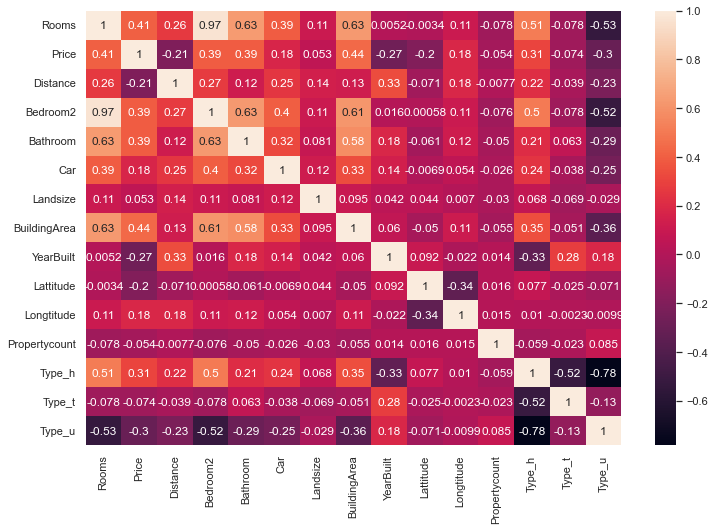

In [94]:
# any change in correlation?

# drop suburb for analysis so only dummy coding for Type
dummy_data_imputed = pd.get_dummies(imputed_data, columns = ['Type'])

sns.set(rc = {'figure.figsize':(12,8)})
sns.heatmap(dummy_data_imputed.corr(), annot = True)

In [95]:
# scaling the dataset
standard_scaler_impute = StandardScaler()
scaled_data_impute = standard_scaler_impute.fit(imputed_data_2).transform(imputed_data_2)
scaled_data_impute[1]

# https://stats.stackexchange.com/questions/483187/difference-between-log-transformation-and-standardization

array([-0.14030814,  0.63941067, -1.24855139, -0.11528521,  0.4359451 ,
       -1.70451976, -0.38726774, -0.03349361, -1.67508015])

In [96]:
len(scaled_data_impute)

11700

## Using KMeans with standardscaler

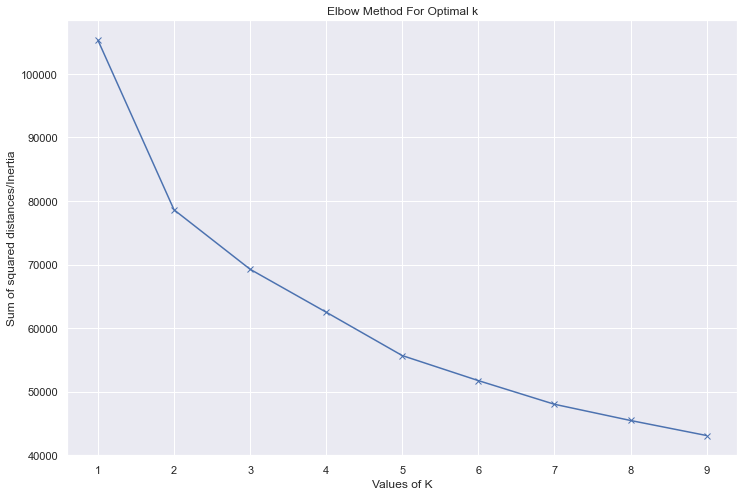

In [97]:
#elbow method to determine number of clusters
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(scaled_data_impute)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

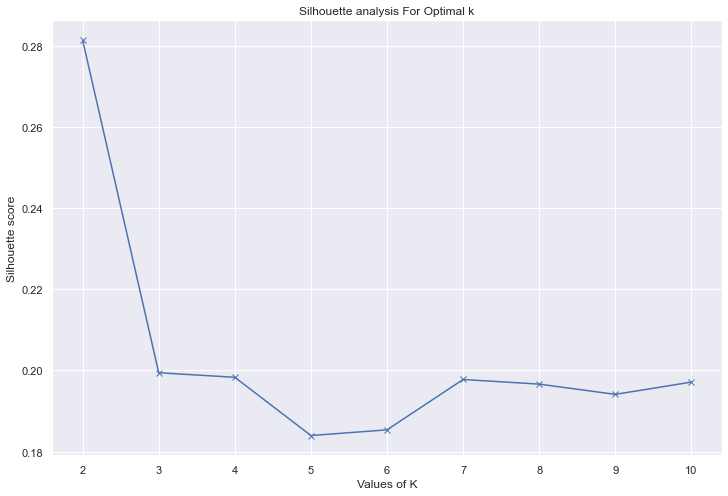

In [98]:
#Silhouette analysis for optimal k

from sklearn.metrics import silhouette_score

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]
silhouette_avg = []
for num_clusters in range_n_clusters:
 
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(scaled_data_impute)
 cluster_labels = kmeans.labels_
 
 # silhouette score
 silhouette_avg.append(silhouette_score(scaled_data_impute, cluster_labels))
plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

In [99]:
# from the KMeans analysis it appears that number of clusters = 4 is the best
kmeans_impute = KMeans(n_clusters = 5, random_state = 0).fit_predict(scaled_data_impute)

In [100]:
print(len(imputed_data_2))
print(len(scaled_data_impute))
print(len(kmeans_impute))

11700
11700
11700


In [101]:
# creating a new column to variables with kmeans
kmeans_impute_standardscaler = imputed_data_2.copy()
kmeans_impute_standardscaler['kmeans_groups'] = kmeans_impute
kmeans_impute_standardscaler.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",2
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",2
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0
3,4,"1,050,173.00",2.50,3.00,2.00,2.00,400.00,220.00,"2,006.00",0
4,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",2


<AxesSubplot:>

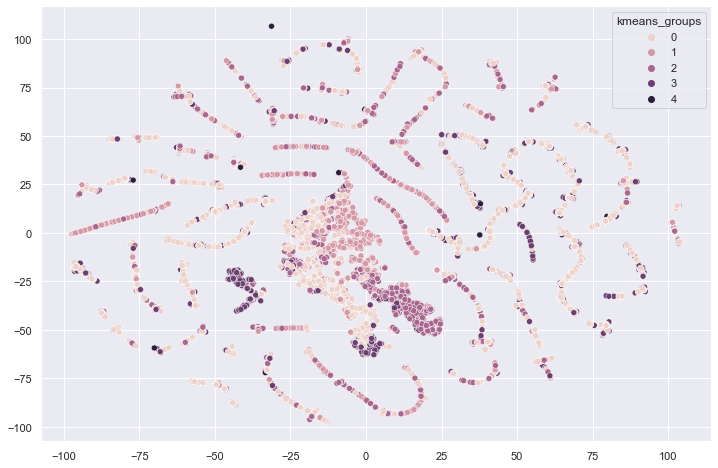

In [102]:
# perform t-SNE on grouping parameters
tsne = TSNE()
X_stdscaler_kmeans_impute = tsne.fit_transform(kmeans_impute_standardscaler)

sns.scatterplot(X_stdscaler_kmeans_impute[:,0],X_stdscaler_kmeans_impute[:,1],
               hue = kmeans_impute_standardscaler['kmeans_groups'],
                legend = 'full')

<AxesSubplot:>

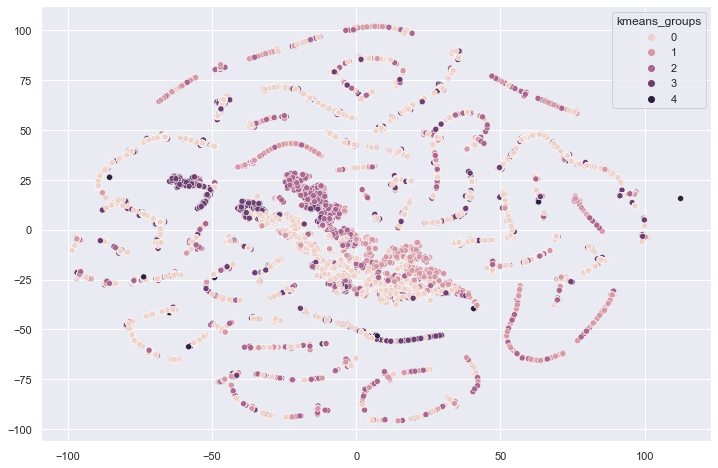

In [103]:
# perform t-SNE on grouping parameters
tsne = TSNE(n_components=2, perplexity=30.0, verbose=0)
X_stdscaler_kmeans_impute = tsne.fit_transform(kmeans_impute_standardscaler)

sns.scatterplot(X_stdscaler_kmeans_impute[:,0],X_stdscaler_kmeans_impute[:,1],
               hue = kmeans_impute_standardscaler['kmeans_groups'],
                legend = 'full')

<AxesSubplot:>

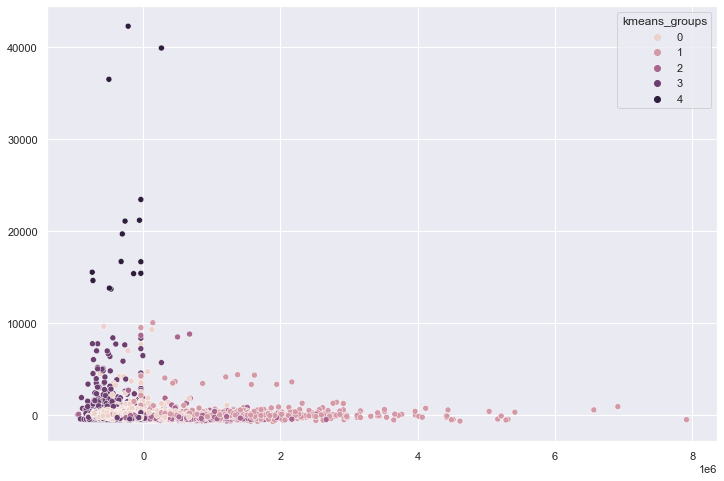

In [104]:
# perform PCA on grouping parameters
pca = PCA(n_components=2)
PC_impute_kmeans_stdscaler = pca.fit_transform(kmeans_impute_standardscaler)

sns.scatterplot(PC_impute_kmeans_stdscaler[:,0], 
                PC_impute_kmeans_stdscaler[:,1],
               hue = kmeans_impute_standardscaler['kmeans_groups'],
                legend = 'full')

In [105]:
# KMeans Standard Scaler

# importing Type and other data back in
kmeans_standard_scaler_impute_type = pd.concat([kmeans_impute_standardscaler, 
                                             additional_data_impute], axis =1)
# dummy code Type
Type_names_impute = pd.get_dummies(kmeans_standard_scaler_impute_type['Type'])
kmeans_standard_scaler_impute_type[['h','u','t']] = Type_names_impute
kmeans_standard_scaler_impute_type = kmeans_standard_scaler_impute_type.drop('Type',axis=1)
kmeans_standard_scaler_impute_type.head()

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,kmeans_groups,Suburb,Longtitude,Lattitude,Propertycount,h,u,t
0,2,"1,035,000.00",2.50,2.00,1.00,0.00,156.00,79.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
1,3,"1,465,000.00",2.50,3.00,2.00,0.00,134.00,150.00,"1,900.00",2,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
2,4,"1,600,000.00",2.50,3.00,1.00,2.00,120.00,142.00,"2,014.00",0,Abbotsford,144.99,-37.81,"4,019.00",1,0,0
3,4,"1,050,173.00",2.50,3.00,2.00,2.00,400.00,220.00,"2,006.00",0,Abbotsford,145.00,-37.80,"4,019.00",1,0,0
4,3,"1,876,000.00",2.50,4.00,2.00,0.00,245.00,210.00,"1,910.00",2,Abbotsford,145.00,-37.80,"4,019.00",1,0,0


In [106]:
# cluster vs Type
pd.set_option("display.max_rows", kmeans_standard_scaler_impute_type.index.shape[0])
kmeans_standard_scaler_impute_type.groupby(['kmeans_groups'])['h','u','t'].sum()

,h,u,t
kmeans_groups,,,
0,"3,557.00",515.00,195.00
1,"2,044.00",70.00,7.00
2,"2,671.00",30.00,74.00
3,627.00,290.00,"1,605.00"
4,5.00,1.00,9.00


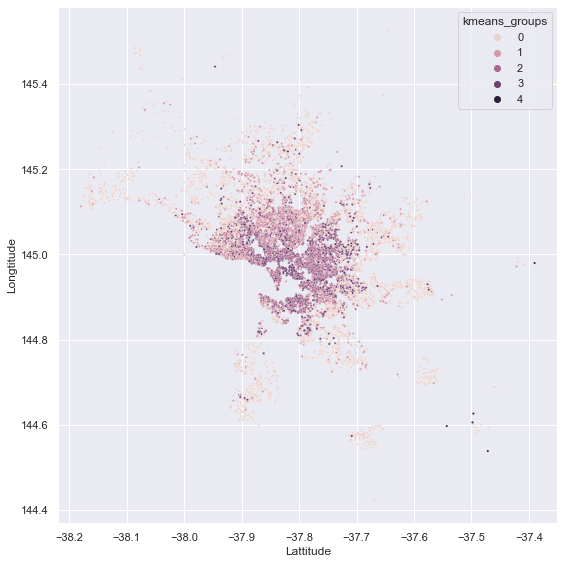

In [107]:
fig, ax = plt.subplots(figsize = (8,8));
sns.scatterplot('Lattitude', 'Longtitude',
                hue = 'kmeans_groups', s = 5,
                 data = kmeans_standard_scaler_impute_type);
fig.tight_layout()
plt.show();

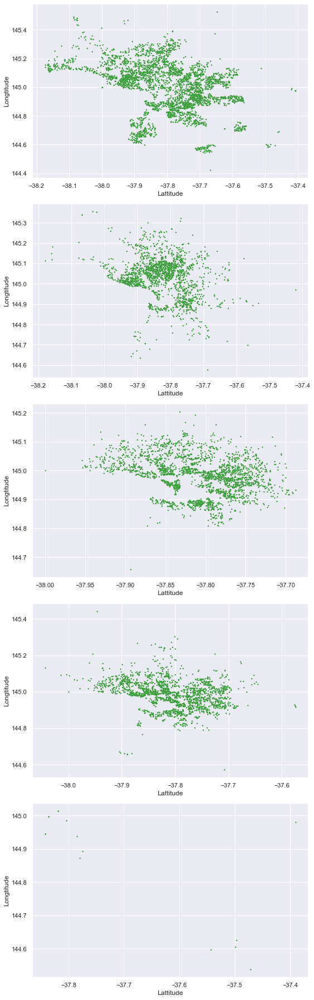

In [108]:
fig, ax = plt.subplots(figsize = (8,25));
ax = plt.subplot(5,1,1)
sns.scatterplot(kmeans_standard_scaler_impute_type['Lattitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==0], 
                kmeans_standard_scaler_impute_type['Longtitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==0],
                s = 5, color = 'green');
ax = plt.subplot(5,1,2)
sns.scatterplot(kmeans_standard_scaler_impute_type['Lattitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==1], 
                kmeans_standard_scaler_impute_type['Longtitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==1],
                s = 5, color = 'green');
ax = plt.subplot(5,1,3)
sns.scatterplot(kmeans_standard_scaler_impute_type['Lattitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==2], 
                kmeans_standard_scaler_impute_type['Longtitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==2],
                s = 5, color = 'green');
ax = plt.subplot(5,1,4)
sns.scatterplot(kmeans_standard_scaler_impute_type['Lattitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==3], 
                kmeans_standard_scaler_impute_type['Longtitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==3],
                s = 5, color = 'green');
ax = plt.subplot(5,1,5)
sns.scatterplot(kmeans_standard_scaler_impute_type['Lattitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==4], 
                kmeans_standard_scaler_impute_type['Longtitude'][kmeans_standard_scaler_impute_type['kmeans_groups']==4],
                s = 5, color = 'green');
fig.tight_layout()
plt.show();

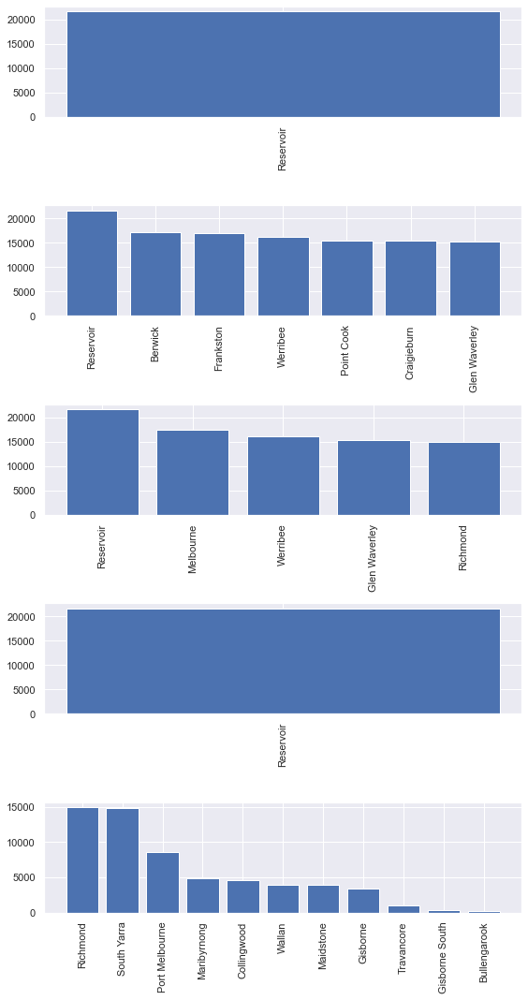

In [109]:
# as kmeans group is the best, let's look at property/houses for each 
fig, ax = plt.subplots(figsize = (8,15));
for group in kmeans_standard_scaler_impute_type['kmeans_groups'].unique():
    data_clusters_impute = kmeans_standard_scaler_impute_type[kmeans_standard_scaler_impute_type['kmeans_groups'] == group]
    # pick 15 largest suburb populations
    data_sorted_impute=data_clusters_impute.sort_values(by=['Propertycount'],ascending=False)[0:50]
    # plot results
    ax = plt.subplot(5,1,group+1) 
    plt.bar(data_sorted_impute['Suburb'], data_sorted_impute['Propertycount'])
    plt.xticks(rotation=90)
    plt.tight_layout()
plt.show()